---
# Main Program
---

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import math
import time

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.pylab as pl
from matplotlib.gridspec import GridSpec
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as mpe
%matplotlib inline
import mplcyberpunk as mplcp


import ipywidgets as widgets


from IPython.display import display,Image, clear_output
from sklearn.model_selection import train_test_split

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error  

#import investpy

from binance.client import Client
client = Client()

#import warnings
#warnings.simplefilter(action='ignore', category=FutureWarning)

#------------ My Functions ------------#
from Functions.Visualization import Plots
from Functions.Preparation_Data import Preprocessing
from Functions.Extract_Data.Binance_API.Extract_Binance_Data import Binance
from Functions.Feature_Engineering.FE import Feature_Engineering
from Functions.Randomized_Grid_Search import RGS_M
from Functions.Momentum_Based_Strategies import MBS
#------------ My Functions ------------#

In [2]:
from matplotlib.animation import FuncAnimation
import matplotlib.patheffects as mpe
import mplcyberpunk as mplcp

from sklearn.model_selection import train_test_split

In [3]:
lr = LinearRegression()

# Define the model
dtr = DecisionTreeRegressor()

In [4]:
df = pd.read_csv('../Forecast_Prices/Data/Cryptocurrency/Crypto_Data.csv', index_col='Open time')
df

,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,BNBUSDT_Open,...,BCHBUSD_Low,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,13.7159,...,202.63,203.65,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593
2020-01-02,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,13.7072,...,192.41,195.44,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530
2020-01-03,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,13.0104,...,192.22,221.76,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624
2020-01-04,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,13.6481,...,219.37,224.18,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640
2020-01-05,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,13.7978,...,221.05,222.62,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,246.3000,...,96.10,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877
2023-01-02,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,244.5000,...,95.40,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907
2023-01-03,16667.39,16774.13,16597.71,16669.47,5.884571e+08,1213.61,1219.58,1204.32,1214.14,245.3000,...,98.70,99.70,0.07370,0.07440,0.07280,0.07350,1.906,1.910,1.861,1.890


In [5]:
#df = Feature_Engineering.Log_Return(dataframe=df, name_of_column='BTCBUSD_Open')
#df

In [6]:
df = Preprocessing.Select_Target(dataframe=df, column_name='BTCBUSD_Close')
df

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()



,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,BCHBUSD_Low,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,6945.33,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,...,202.63,203.65,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593
2020-01-03,7329.20,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,...,192.41,195.44,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530
2020-01-04,7346.20,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,...,192.22,221.76,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624
2020-01-05,7351.42,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,...,219.37,224.18,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640
2020-01-06,7755.10,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,...,221.05,222.62,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,96.50,97.10,0.07240,0.07240,0.07080,0.07110,1.833,1.850,1.828,1.831
2023-01-02,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,96.10,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877
2023-01-03,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,95.40,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907


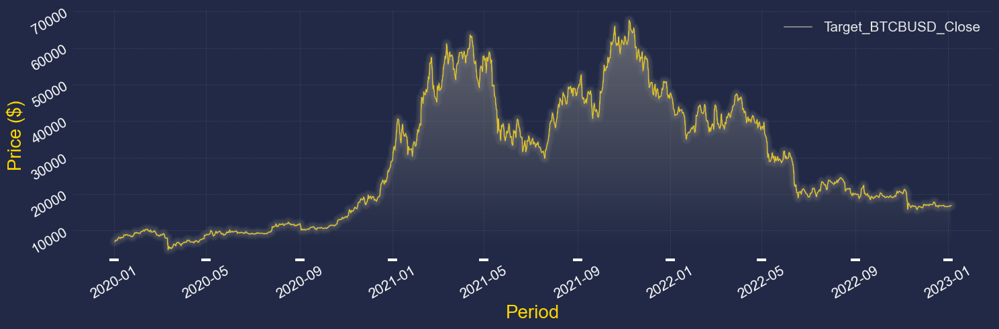

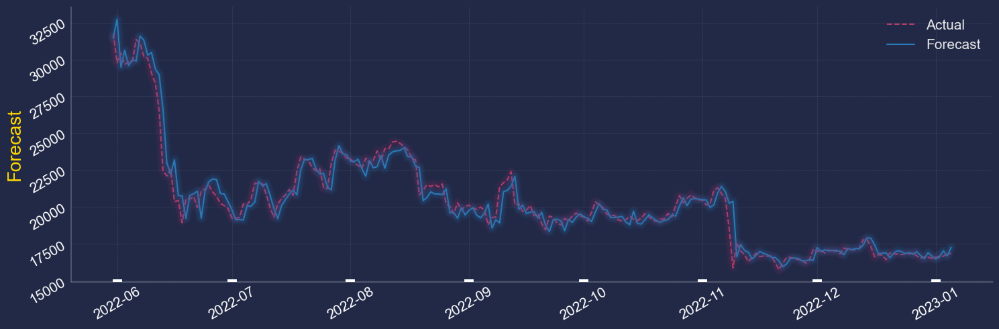

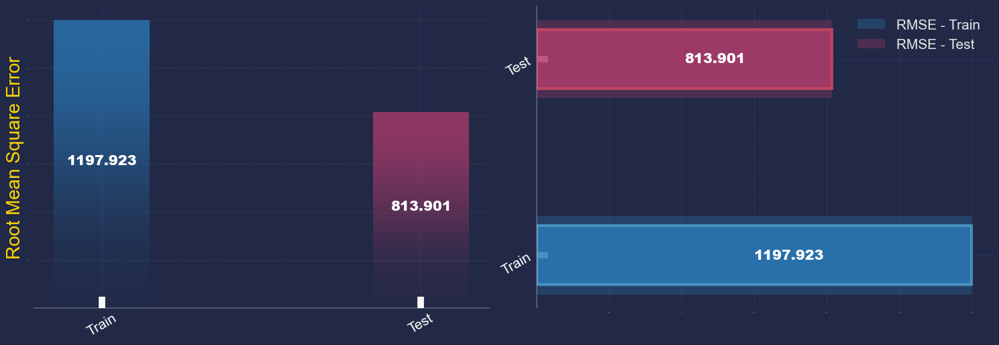

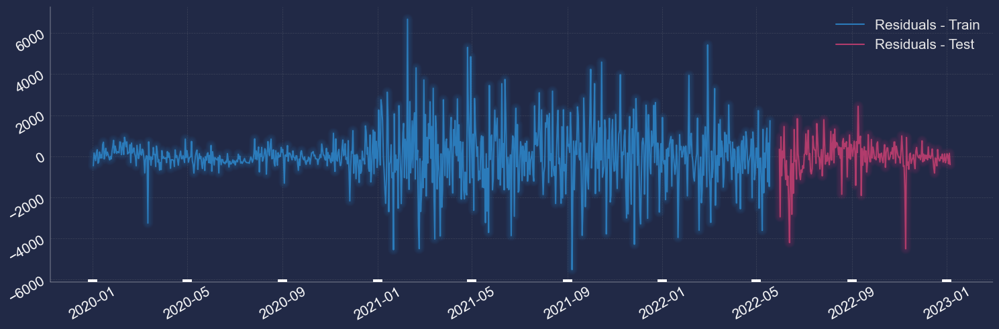

In [7]:
Plots.Plot_Of_Line(dataframe=df, column_name='Target_BTCBUSD_Close')
#Plots.Plot_Percentage(dataframe=df, column_name_1='BUSDUSDT_Volume', column_name_2='BTCBUSD_Open')
#Plots.Plot_Train_Test_Split(dataframe=df)
#Plots.Plot_Train_Test_Splits(dataframe=df)

Plots.Recursive_Forecast_Plot_Split(dataframe=df, model=lr)

#Plots.Characteristics_of_LinearRegression(model=dtr)

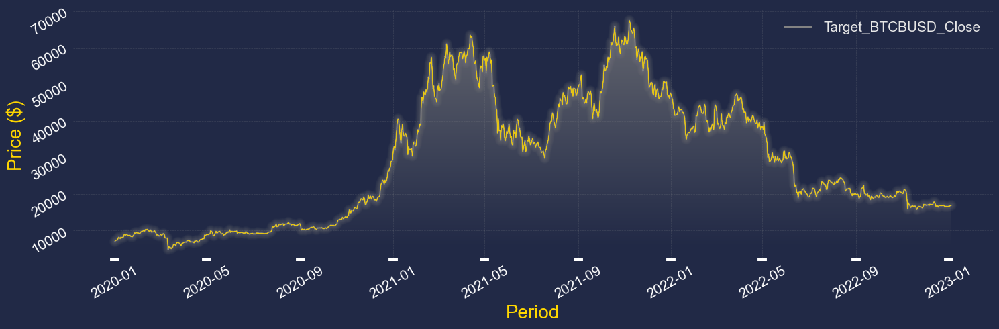

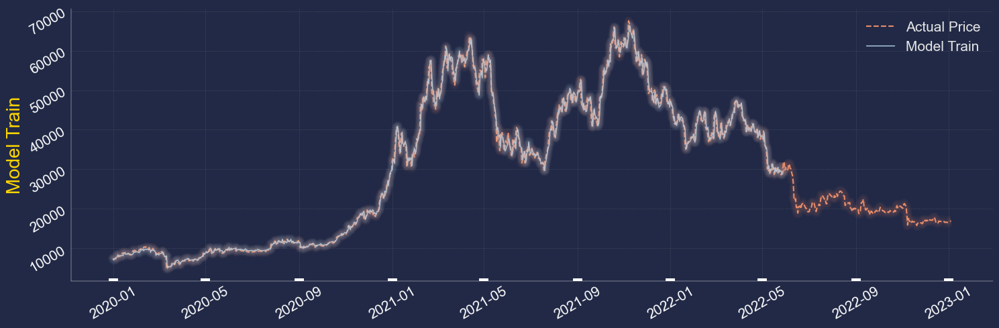

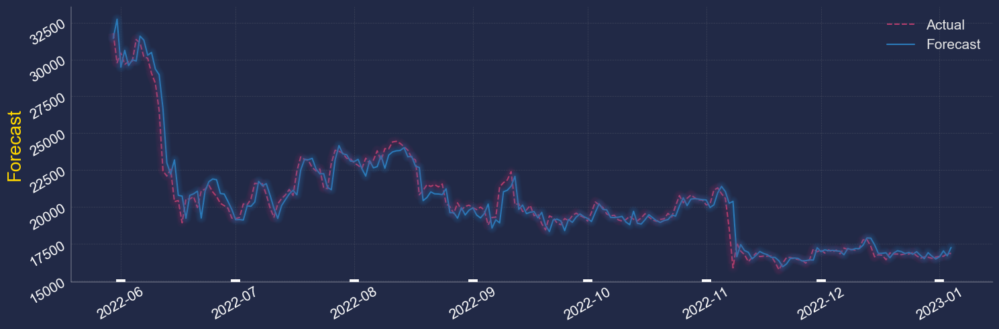

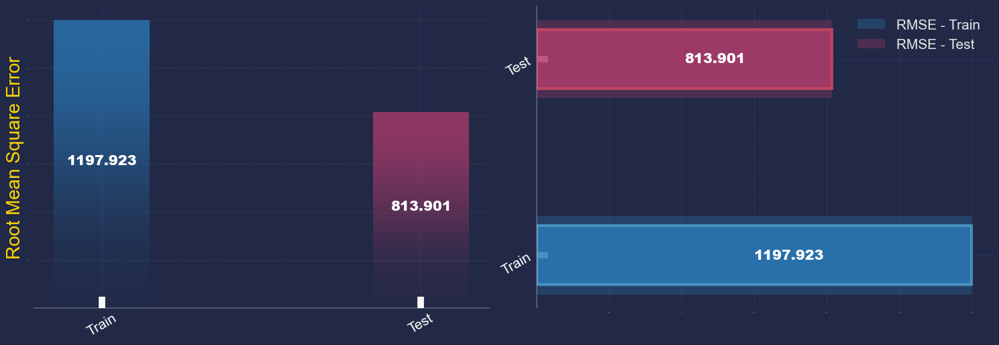

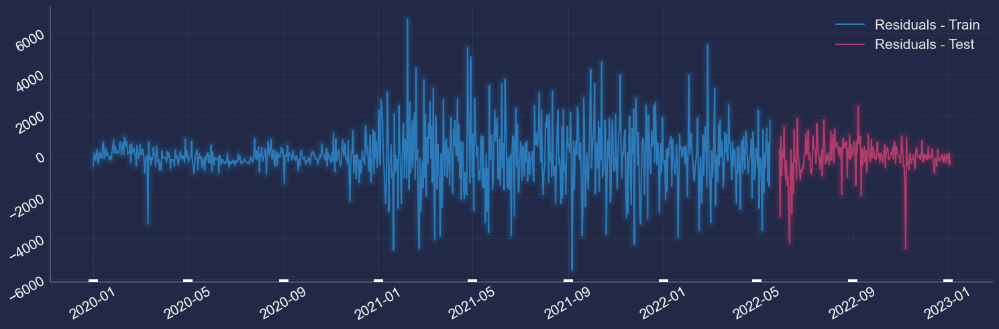

In [41]:
Plots.Plot_Of_Line(dataframe=df, column_name='Target_BTCBUSD_Close')
#Plots.Plot_Percentage(dataframe=df, column_name_1='BUSDUSDT_Volume', column_name_2='BTCBUSD_Open')
#Plots.Plot_Train_Test_Split(dataframe=df)
#Plots.Plot_Train_Test_Splits(dataframe=df)

Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=df, model=lr)

#Plots.Characteristics_of_LinearRegression(model=lr)

-------------------------
Full Length is:  1100
Length of Train is:  1070
Length of Test is:  30
-------------------------



!!!------------... Start Randomized Search CV ...------------!!!
The Random Hyparameters Tuning is:  DecisionTreeRegressor(criterion='absolute_error', min_impurity_decrease=0.1,
                      min_samples_leaf=2)
------------------------------------------------------------------
Train-Set Root Mean Square Error:  498.782
Test-Set Root Mean Square Error:  652.43
------------------------------------------------------------------


The Random Hyparameters Tuning is:  DecisionTreeRegressor(criterion='absolute_error', min_impurity_decrease=0.1,
                      min_samples_leaf=2)
------------------------------------------------------------------
Train-Set Root Mean Square Error:  496.699
Test-Set Root Mean Square Error:  617.754
------------------------------------------------------------------


The Random Hyparameters Tuning is:  DecisionTreeRegressor(

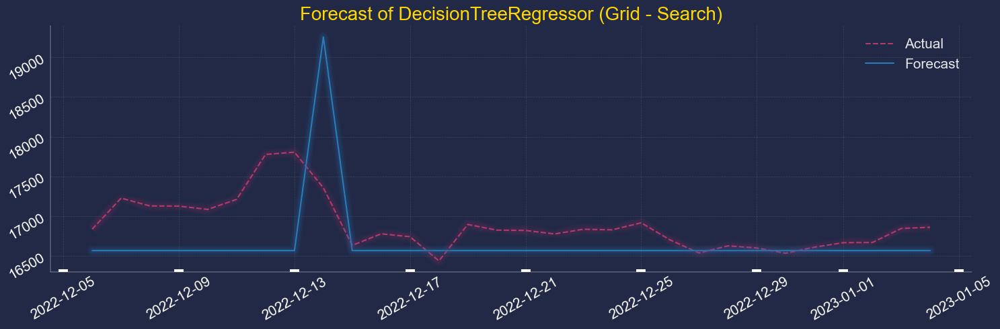

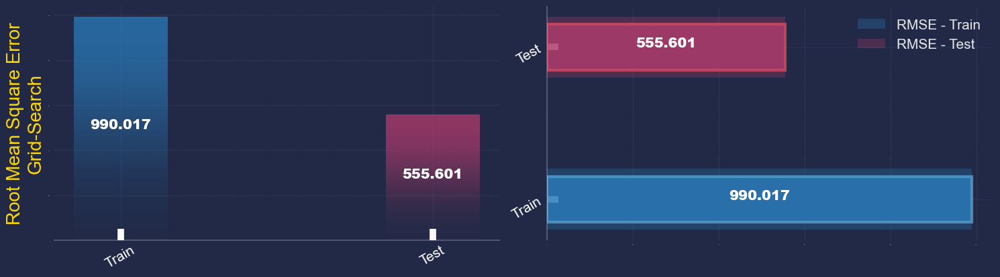

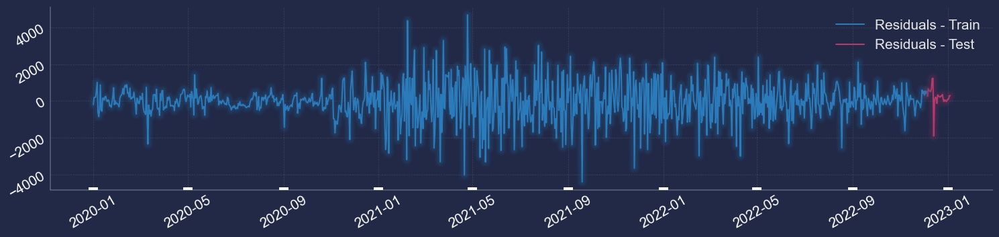

In [9]:
RGS_M.DecisionTreeRegressorModel(dataframe=df)

In [61]:
#RGS_M.Characteristics_of_DecisionTreeRegressor(model=dtr)

NotFittedError: This DecisionTreeRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

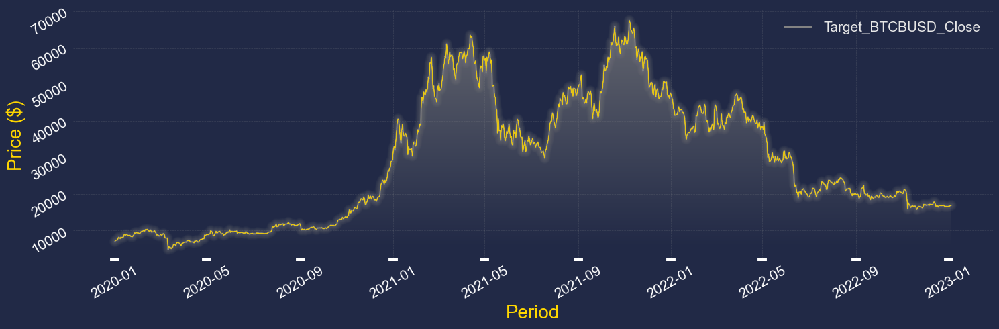

In [42]:
Plots.Plot_Of_Line(dataframe=df, column_name='Target_BTCBUSD_Close')

In [8]:
fe = Feature_Engineering(dataframe=df)

#df = fe.Moving_Average(name_of_column=['Target_BTCBUSD_Close'], ma_number=9)
#df = fe.Moving_Average(name_of_column=['Target_BTCBUSD_Close'], ma_number=50)

#df = fe.Relative_Strength_Index(name_of_column=['Target_BTCBUSD_Close'], rsi_number=14)
#df = fe.Relative_Strength_Index(name_of_column=['Target_BTCBUSD_Close', 'QTUMBUSD_Low', 'QTUMBUSD_High'], rsi_number=60)

df

,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close_RSI_14
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,6945.33,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,...,203.65,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593,NaN
2020-01-03,7329.20,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,...,195.44,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530,NaN
2020-01-04,7346.20,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,...,221.76,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624,NaN
2020-01-05,7351.42,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,...,224.18,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640,NaN
2020-01-06,7755.10,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,...,222.62,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,97.10,0.07240,0.07240,0.07080,0.07110,1.833,1.850,1.828,1.831,44.296960
2023-01-02,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877,45.774402
2023-01-03,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907,45.826644


In [9]:
df = Preprocessing.Drop_Missing_Data(dataframe=df, axis_=0)
df

--- Start Drop_Missing_Data()
.
.
--- End  Drop_Missing_Data()



,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close_RSI_14
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-16,8710.19,8810.87,8899.00,8558.69,8813.85,9.826565e+06,165.46,171.76,159.03,166.15,...,339.76,0.05236,0.05656,0.05165,0.05476,1.898,2.099,1.881,1.974,75.820590
2020-01-17,8888.52,8813.82,8844.56,8581.81,8710.19,6.590200e+06,166.53,166.53,158.29,163.97,...,326.53,0.05476,0.05489,0.05209,0.05359,1.974,1.997,1.857,1.939,77.915219
2020-01-18,8909.19,8709.23,9009.68,8661.63,8888.52,1.277904e+07,164.25,174.09,161.93,170.34,...,366.20,0.05330,0.06438,0.05330,0.06078,1.928,2.206,1.894,2.091,78.151476
2020-01-19,8690.65,8893.76,8973.91,8800.00,8909.19,9.375692e+06,169.00,179.03,165.00,173.94,...,337.24,0.06072,0.06599,0.05757,0.06168,2.081,2.118,1.976,2.041,69.665809
2020-01-20,8626.06,8906.67,9185.00,8480.00,8690.65,9.395520e+06,173.86,177.75,161.59,166.63,...,338.77,0.06118,0.06602,0.05840,0.06002,2.015,2.076,1.870,1.928,67.338618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,97.10,0.07240,0.07240,0.07080,0.07110,1.833,1.850,1.828,1.831,44.296960
2023-01-02,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877,45.774402
2023-01-03,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907,45.826644


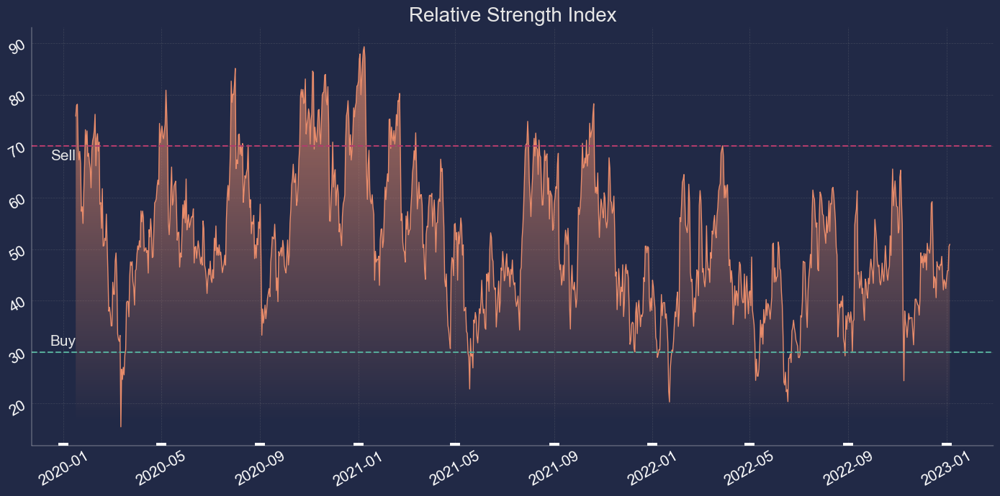

In [10]:
MBS.Plot_Relative_Strength_Index(dataframe=df, rsi_column_name='Target_BTCBUSD_Close_RSI_14')

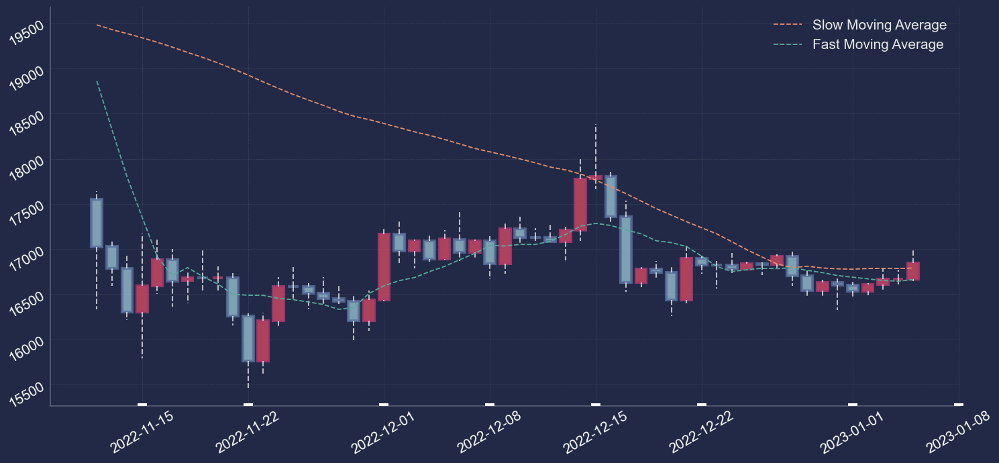

In [37]:
# Define the OHLC function
def OHLC(dataframe, col_open, col_high, col_low, col_close, fma, sma):
        
    #Create the checkbox widget
    sma_checkbox = widgets.Checkbox(value=False, description='Slow Moving Average', disabled=False, indent=False)
    fma_checkbox = widgets.Checkbox(value=False, description='Fast Moving Average', disabled=False, indent=False)
    
    new_dataframe = dataframe.copy()
    list_index = new_dataframe[-55:].index
    list_index = pd.to_datetime(list_index)

    list_open = new_dataframe[col_open][-55:].values
    list_high = new_dataframe[col_high][-55:].values
    list_low = new_dataframe[col_low][-55:].values
    list_close = new_dataframe[col_close][-55:].values
        
    mo_av_s = new_dataframe[sma][-55:].values
    mo_av_f = new_dataframe[fma][-55:].values
    
    def plot_ohlc(change=None):
        # Clear the current output
        clear_output(wait=True)

        #Display the checkbox
        box = widgets.HBox([sma_checkbox, fma_checkbox])
        display(box)
        
        plt.style.use("cyberpunk")  # Background color
        pal_red = sns.color_palette("flare")  # Red color palette
        pal_green = sns.color_palette("light:#5A9")  # Green color palette
        pal_blue = sns.color_palette("ch:start=.2,rot=-.3") # Blue color palette
        fig, ax1 = plt.subplots(figsize=(15, 7), tight_layout=True)  # Figure size
        
        plt.legend(['Actual','Forecast'], loc="upper right", fontsize=15) #Label - Size of plot
        plt.tick_params(axis='x', labelrotation=30, labelsize=15, width=10, length=3,  direction="in", colors='White') #Rotation label x and y
        plt.tick_params(axis='y', labelrotation=30, labelsize=15, colors='White') #Rotation label x and y
        plt.grid(zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot

        for _ in range(len(list_index)):
            if (list_open[_] - list_close[_]) > 0:
                ax1.bar(list_index[_], list_open[_] - list_close[_], width=0.7, linewidth=3, alpha=0.8, bottom=list_close[_], edgecolor=pal_blue[3], color=pal_blue[1])
                plt.vlines(x=list_index[_], ymin=list_open[_], ymax=list_high[_], alpha=0.7, linestyles="dashed", colors="Snow")
                plt.vlines(x=list_index[_], ymin=list_close[_], ymax=list_low[_], alpha=0.7, linestyles="dashed", colors="Snow")
            else:
                ax1.bar(list_index[_], list_close[_] - list_open[_], width=0.7, linewidth=3, alpha=0.8, bottom=list_open[_], edgecolor=pal_red[3], color=pal_red[2])
                plt.vlines(x=list_index[_], ymin=list_close[_], ymax=list_high[_], alpha=0.7, linestyles="dashed", colors="Snow")
                plt.vlines(x=list_index[_], ymin=list_open[_], ymax=list_low[_], alpha=0.7, linestyles="dashed", colors="Snow")

        # Update the last bar's color based on the checkbox state
        if sma_checkbox.value:
            plt.plot(list_index, mo_av_s, linewidth=1.3, label='Slow Moving Average', linestyle='--', color=pal_red[0])
            plt.legend(loc="upper right", fontsize=15) #Label - Size of plot
        if fma_checkbox.value:
            plt.plot(list_index, mo_av_f, linewidth=1.3, label='Fast Moving Average', linestyle='--', color=pal_green[5])
            plt.legend(loc="upper right", fontsize=15) #Label - Size of plot
    
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.spines['left'].set_color('White')
        ax1.spines['left'].set_linewidth(0.3)
        ax1.spines['bottom'].set_color('White')
        ax1.spines['bottom'].set_linewidth(0.3)
        
        plt.show()
        
        #Attach the observer to the checkbox
        sma_checkbox.observe(plot_ohlc, names='value')
        fma_checkbox.observe(plot_ohlc, names='value')
            
    # Initial plot
    plot_ohlc()
    



OHLC(dataframe=df, col_open='BTCBUSD_Open', col_high='BTCBUSD_High', col_low='BTCBUSD_Low', col_close='BTCBUSD_Close', fma='Target_BTCBUSD_Close_FMA_9', sma='Target_BTCBUSD_Close_SMA_50') #rsd

In [176]:
new_dataframe = df.copy()
        
old_index_df = new_dataframe
old_index_df['Old_Index'] = new_dataframe.index
old_index_df['Old_Index'] = old_index_df['Old_Index'].shift(1)


,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close_FMA_9,Target_BTCBUSD_Close_SMA_50,Target_BTCBUSD_Close_RSI_14,Old_Index
Open time,,,,,,,,,,,,,,,,,,,,,
2020-02-19,9603.98,10189.16,10264.15,9350.03,9598.06,2.390103e+07,283.54,285.09,251.53,258.47,...,0.06835,0.07012,2.634,2.716,2.435,2.444,9984.452222,8970.6548,50.674481,2020-02-19
2020-02-20,9689.00,9597.61,9698.87,9410.00,9603.98,2.631198e+07,258.38,264.28,245.80,257.57,...,0.06750,0.07039,2.426,2.482,2.290,2.394,9911.563333,9025.5282,52.123817,2020-02-20
2020-02-21,9666.67,9603.56,9762.40,9574.62,9689.00,2.037413e+07,257.05,268.36,254.01,265.35,...,0.06973,0.07115,2.375,2.464,2.362,2.421,9848.971111,9072.2776,51.694190,2020-02-21
2020-02-22,9964.16,9687.74,9717.48,9567.04,9666.67,1.551366e+07,265.58,266.94,256.47,262.13,...,0.06945,0.07013,2.435,2.435,2.350,2.392,9804.388889,9124.6368,56.802554,2020-02-22
2020-02-23,9654.97,9665.11,10018.78,9663.72,9964.16,1.973050e+07,261.98,276.32,261.49,275.11,...,0.07012,0.07300,2.405,2.507,2.401,2.500,9776.777778,9170.7078,50.790750,2020-02-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,0.07080,0.07110,1.833,1.850,1.828,1.831,16688.390000,16777.1130,44.296960,2022-12-31
2023-01-01,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,0.07060,0.07250,1.833,1.882,1.821,1.877,16669.714444,16784.3496,45.774402,2023-01-01
2023-01-02,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,0.07090,0.07380,1.879,1.928,1.844,1.907,16651.990000,16785.8414,45.826644,2023-01-02


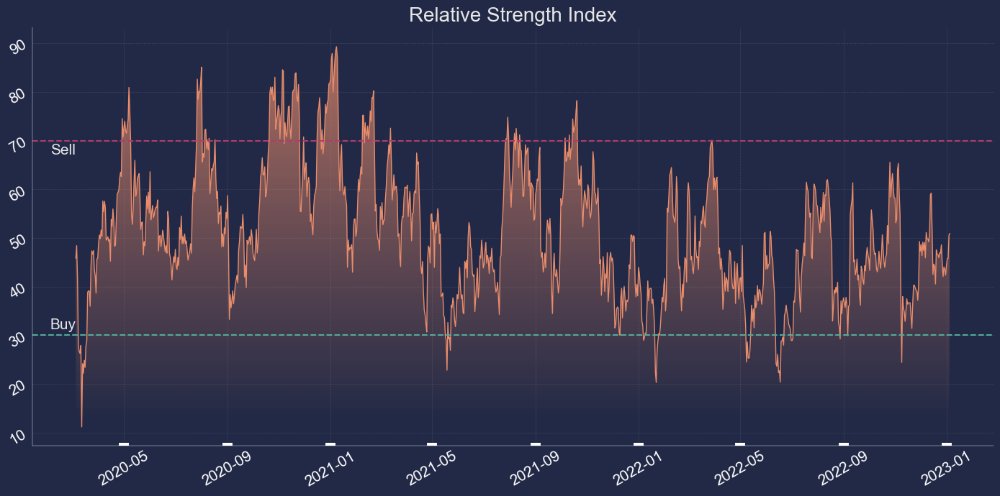

In [75]:
def Plot_Relative_Strength_Index(dataframe, rsi_column_name):
    '''
    This function visualize a plot Relative Strength Index
    ------------------------------
    Parameter(dataframe): DataFrame
    Parameter(rsi_column_name): Column Name
    ------------------------------
    '''
    

    try:
        new_dataframe = dataframe.copy()
        list_index = new_dataframe.index
        list_index = pd.to_datetime(list_index)

        plt.style.use("cyberpunk")  # Background color
        pal_red = sns.color_palette("flare")  # Red color palette
        pal_green = sns.color_palette("light:#5A9")  # Green color palette
        fig, ax1 = plt.subplots(figsize=(14, 7), tight_layout=True)  # Figure size

        ax1.plot(list_index, new_dataframe[rsi_column_name].values, linewidth=1, color=pal_red[0])
        mplcp.add_gradient_fill(alpha_gradientglow=0.7) #Glow - Effect lines
    
        ax1.axhline(30, linestyle='--', linewidth=1.5, color=pal_green[5])
        ax1.axhline(70, linestyle='--', linewidth=1.5, color=pal_red[3])
        ax1.text(list_index[0], 32, 'Buy', ha ='right', va ='center', fontsize=15) 
        ax1.text(list_index[0], 68, 'Sell', ha ='right', va ='center', fontsize=15) 
        
        ax1.set_title('Relative Strength Index', fontdict={'fontsize':20})
        plt.tick_params(axis='x', labelrotation=30, labelsize=15, width=10, length=3,  direction="in", colors='White') #Rotation label x and y
        plt.tick_params(axis='y', labelrotation=30, labelsize=15, colors='White') #Rotation label x and y
        plt.grid(zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot

        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.spines['left'].set_color('White')
        ax1.spines['left'].set_linewidth(0.3)
        ax1.spines['bottom'].set_color('White')
        ax1.spines['bottom'].set_linewidth(0.3)
        
        plt.show()
    except:
        print('No option!\nError')

    
Plot_Relative_Strength_Index(dataframe=df, rsi_column_name='Target_BTCBUSD_Close_RSI_14')

In [58]:
df

,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close_FMA_9,Target_BTCBUSD_Close_SMA_50,Target_BTCBUSD_Close_RSI_14
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-20,9603.98,10189.16,10264.15,9350.03,9598.06,2.390103e+07,283.54,285.09,251.53,258.47,...,0.07955,0.06835,0.07012,2.634,2.716,2.435,2.444,9984.452222,8970.6548,NaN
2020-02-21,9689.00,9597.61,9698.87,9410.00,9603.98,2.631198e+07,258.38,264.28,245.80,257.57,...,0.07149,0.06750,0.07039,2.426,2.482,2.290,2.394,9911.563333,9025.5282,NaN
2020-02-22,9666.67,9603.56,9762.40,9574.62,9689.00,2.037413e+07,257.05,268.36,254.01,265.35,...,0.07275,0.06973,0.07115,2.375,2.464,2.362,2.421,9848.971111,9072.2776,NaN
2020-02-23,9964.16,9687.74,9717.48,9567.04,9666.67,1.551366e+07,265.58,266.94,256.47,262.13,...,0.07152,0.06945,0.07013,2.435,2.435,2.350,2.392,9804.388889,9124.6368,NaN
2020-02-24,9654.97,9665.11,10018.78,9663.72,9964.16,1.973050e+07,261.98,276.32,261.49,275.11,...,0.07336,0.07012,0.07300,2.405,2.507,2.401,2.500,9776.777778,9170.7078,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,0.07240,0.07080,0.07110,1.833,1.850,1.828,1.831,16688.390000,16777.1130,44.296960
2023-01-02,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877,16669.714444,16784.3496,45.774402
2023-01-03,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907,16651.990000,16785.8414,45.826644


In [67]:
lr.fit(X_train, y_train)
predict_value = lr.predict(X_test)

predict_index = X_test.index

In [73]:
predict_index[1]

'2022-12-07'

In [74]:
predict_value[1]

16705.354112585086

In [12]:
def Train_Test_Split(dataframe):
    X = dataframe.iloc[:, 1:]
    y = dataframe.iloc[:, 0]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, shuffle=False) #80% X_train - 20% X_test
    
    print('-------------------------')
    print('Full Length is: ', len(X))
    print('Length of Train is: ', len(X_train))
    print('Length of Test is: ', len(X_test))
    print('-------------------------\n\n\n')
    
    return X_train, X_test, y_train, y_test
X_train, X_test, y_train, y_test = Train_Test_Split(dataframe=df)

def RMSE(model, Xtrain, Xtest, ytrain, ytest):
    global predict_test, predict_test, Train_RMSE, Test_RMSE
    model.fit(Xtrain,ytrain)
        
    #------------#
    predict_train = model.predict(Xtrain)
    predict_test = model.predict(Xtest)
    #------------#

    #print('The Random Hyparameters Tuning is: ', random_search.best_estimator_)
    print('------------------------------------------------------------------')

    Train_MSE = mean_squared_error(ytrain, predict_train)
    Train_RMSE = math.sqrt(Train_MSE)
    Train_RMSE = round(Train_RMSE,3)
    print('Train-Set Root Mean Square Error: ', Train_RMSE)
        
    Test_MSE = mean_squared_error(ytest, predict_test)
    Test_RMSE = math.sqrt(Test_MSE)
    Test_RMSE = round(Test_RMSE,3)
    print('Test-Set Root Mean Square Error: ', Test_RMSE)
    print('------------------------------------------------------------------')

    
    
print('!!!------------... Start Grid Search CV ...------------!!!')
RMSE(model=lr, Xtrain=X_train, Xtest=X_test, ytrain=y_train, ytest=y_test)
print('!!!------------... End Grid Search CV ...------------!!!\n\n\n')

-------------------------
Full Length is:  1100
Length of Train is:  1045
Length of Test is:  55
-------------------------





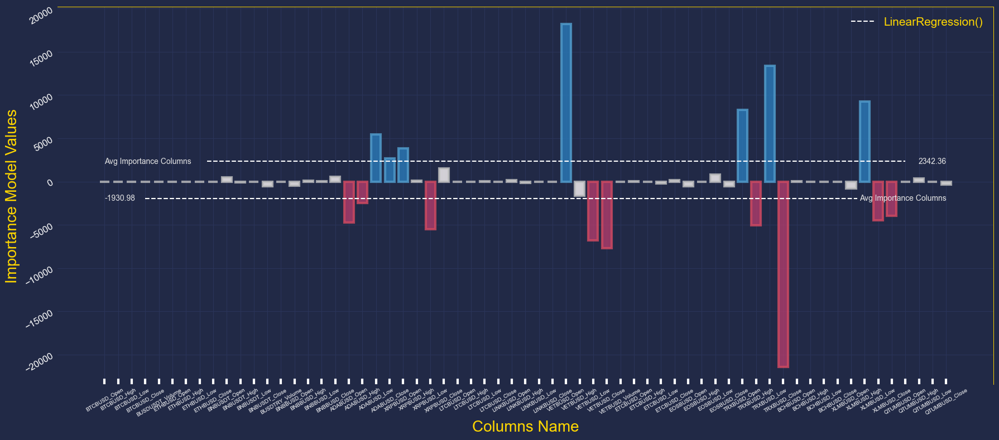

In [18]:
Characteristics_of_LinearRegression(model=lr)

In [ ]:
def Train_Test_Split(dataframe):
    X = dataframe.iloc[:, 1:]
    y = dataframe.iloc[:, 0]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, shuffle=False) #80% X_train - 20% X_test
    
    print('-------------------------')
    print('Full Length is: ', len(X))
    print('Length of Train is: ', len(X_train))
    print('Length of Test is: ', len(X_test))
    print('-------------------------\n\n\n')
    
    return X_train, X_test, y_train, y_test
X_train, X_test, y_train, y_test = Train_Test_Split(dataframe=df)

In [15]:
def Train_Test_Split(dataframe):
    X = dataframe.iloc[:, 1:]
    y = dataframe.iloc[:, 0]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False) #80% X_train - 20% X_test
    
    print('-------------------------')
    print('Full Length is: ', len(X))
    print('Length of Train is: ', len(X_train))
    print('Length of Test is: ', len(X_test))
    print('-------------------------\n\n\n')
    
    #return X_train, X_test, y_train, y_test
    return X,y
#X_train, X_test, y_train, y_test = Train_Test_Split(dataframe=df)
X, Y = Train_Test_Split(dataframe=df)

-------------------------
Full Length is:  1100
Length of Train is:  880
Length of Test is:  220
-------------------------





In [43]:
import pandas_ta as pta

class Feature_Engineering:
    '''
    This class generate new Dataframe of Feature Engineering
    '''
    
    #Constuctor
    def __init__(self, dataframe):
        '''
        Constructor of Feature_Engineering class
        ------------------------------
        Parameter(dataframe): DataFrame
        ------------------------------
        '''
        
        self.data = dataframe
        
#------------------------------------------------------------------------------------------------------------------------------#        
    def Log_Return(self, name_of_column):
        '''
        This Function of Feature_Engineering return Dataframe with Log Return
        ------------------------------
        Parameter(dataframe): DataFrame
        Parameter(name_of_column): LIST of dataframe column name
        ------------------------------
        '''
        
        try:
            new_dataframe = self.data.copy()

            for _ in range(len(name_of_column)):
                new_dataframe[name_of_column[_]+'_Lg'] = np.log(new_dataframe[name_of_column[_]] / new_dataframe[name_of_column[_]].shift(1))
            return new_dataframe
        except:
            print('No option!\nError')
#------------------------------------------------------------------------------------------------------------------------------#    
    def Moving_Average(self, name_of_column, ma_number):
        '''
        This Function of Feature_Engineering return Dataframe with (Slow or Fast) Moving Average Return
        -Fast Moving Average (FMA): Used for short-term trends, typically with smaller periods like 9, 12, or 20.
        -Slow Moving Average (SMA): Used for long-term trends, typically with larger periods like 50, 100, or 200.
        ------------------------------
        Parameter(name_of_column): LIST of dataframe column name
        Parameter(ma_number): Number of Moving Average (Slow - Fast)
        ------------------------------
        '''
        
        try:
            new_dataframe = self.data.copy()
        
            for _ in range(len(name_of_column)):
                if (ma_number >=5 and ma_number <= 25):
                    new_dataframe[name_of_column[_]+'_FMA_'+str(ma_number)] = new_dataframe[name_of_column[_]].rolling(window = ma_number).mean()
                elif (ma_number >=40 and ma_number <= 250):
                    new_dataframe[name_of_column[_]+'_SMA_'+str(ma_number)] = new_dataframe[name_of_column[_]].rolling(window = ma_number).mean()
            return new_dataframe
        except:
            print('No option!\nError')
#------------------------------------------------------------------------------------------------------------------------------#    
    def Rolling_Standar_Diviation(self, name_of_column, rsd_number):
        '''
        This Function of Feature_Engineering return Dataframe with Rolling Standar Diviation Return
        -Short-Term Trends Rolling Window Size: 10–20 periods
        -Long-Term Trends Rolling Window Size: 100–200 periods
        ------------------------------
        Parameter(name_of_column): LIST of dataframe column name
        Parameter(rsd_number): Number of Rolling Standar Diviation
        ------------------------------
        '''
        
        try:
            new_dataframe = self.data.copy()
        
            for _ in range(len(name_of_column)):
                new_dataframe[name_of_column[_]+'_RSD_'+str(rsd_number)] = new_dataframe[name_of_column[_]].rolling(rsd_number).std()
            return new_dataframe
        except:
            print('No option!\nError')
#------------------------------------------------------------------------------------------------------------------------------#    
    def Relative_Strength_Index(self, name_of_column, rsi_number):
        '''
        This Function of Feature_Engineering return Dataframe with Rolling Standar Index Return
        -Buy: RSI < 10 & z = 1
        -Sell: RSI > 60 & z = 0
        
        -Overbought: RSI > 70 indicates the asset may be overbought and could be due for a pullback.
        -Oversold: RSI < 30 suggests the asset might be oversold and could be due for a rebound.
        
        -RSI > 50 suggests bullish momentum.
        -RSI < 50 suggests bearish momentum.
        ------------------------------
        Parameter(name_of_column): LIST of dataframe column name
        Parameter(rsi_number): Number of Rolling Standar Index
        ------------------------------
        '''
        
        try:
            new_dataframe = self.data.copy()
        
            for _ in range(len(name_of_column)):
                new_dataframe[name_of_column[_]+'_RSI_'+str(rsi_number)] = pta.rsi(new_dataframe[name_of_column[_]], length = rsi_number)
            return new_dataframe
        except:
            print('No option!\nError')
#-------------------------------------------------------------------------------------------------------------------------------


In [48]:
fe = Feature_Engineering(dataframe=df)

#df = fe.Moving_Average(name_of_column=['Target_BTCBUSD_Close'], ma_number=9)
#df = fe.Moving_Average(name_of_column=['Target_BTCBUSD_Close'], ma_number=50)

#df = fe.Rolling_Standar_Diviation(name_of_column=['Target_BTCBUSD_Close'], rsd_number=10)
#df = fe.Rolling_Standar_Diviation(name_of_column=['Target_BTCBUSD_Close'], rsd_number=100)

#df = fe.Relative_Strength_Index(name_of_column=['Target_BTCBUSD_Close', 'QTUMBUSD_Low', 'QTUMBUSD_High'], rsi_number=10)
#df = fe.Relative_Strength_Index(name_of_column=['Target_BTCBUSD_Close', 'QTUMBUSD_Low', 'QTUMBUSD_High'], rsi_number=60)

df

,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close_RSI_10,QTUMBUSD_Low_RSI_10,QTUMBUSD_High_RSI_10,Target_BTCBUSD_Close_RSI_60,QTUMBUSD_Low_RSI_60,QTUMBUSD_High_RSI_60,Target_BTCBUSD_Close_FMA_9,Target_BTCBUSD_Close_SMA_50
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,6945.33,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,...,1.591,1.593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-02,7329.20,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,...,1.528,1.530,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-03,7346.20,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,...,1.514,1.624,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-04,7351.42,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,...,1.601,1.640,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-05,7755.10,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,...,1.621,1.629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,1.828,1.831,43.443857,36.345515,21.209553,44.331096,42.024726,40.592512,16688.390000,16777.1130
2023-01-01,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,1.821,1.877,45.979961,35.756627,28.487562,44.497382,41.952960,41.042860,16669.714444,16784.3496
2023-01-02,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,1.844,1.907,46.070677,39.344517,37.681864,44.503073,42.282305,41.689055,16651.990000,16785.8414


In [34]:
df

,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,BCHBUSD_Low,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,6945.33,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,...,202.63,203.65,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593
2020-01-02,7329.20,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,...,192.41,195.44,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530
2020-01-03,7346.20,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,...,192.22,221.76,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624
2020-01-04,7351.42,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,...,219.37,224.18,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640
2020-01-05,7755.10,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,...,221.05,222.62,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,96.50,97.10,0.07240,0.07240,0.07080,0.07110,1.833,1.850,1.828,1.831
2023-01-01,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,96.10,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877
2023-01-02,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,95.40,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907


In [73]:
df2 = fe.Moving_Average(name_of_column=['BTCBUSD_Open','BTCBUSD_Close'], sma_number=20)
df2

,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,BNBUSDT_Open,...,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,BTCBUSD_Open_MA_20,BTCBUSD_Close_MA_20
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,13.7159,...,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593,NaN,NaN
2020-01-02,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,13.7072,...,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530,NaN,NaN
2020-01-03,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,13.0104,...,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624,NaN,NaN
2020-01-04,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,13.6481,...,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640,NaN,NaN
2020-01-05,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,13.7978,...,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,246.3000,...,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877,16882.6240,16852.4335
2023-01-02,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,244.5000,...,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907,16852.5525,16796.9570
2023-01-03,16667.39,16774.13,16597.71,16669.47,5.884571e+08,1213.61,1219.58,1204.32,1214.14,245.3000,...,0.07370,0.07440,0.07280,0.07350,1.906,1.910,1.861,1.890,16797.0060,16740.1515


In [32]:
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df1)
df1

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()



,Target_BTCBUSD_Close,BTCBUSD_Open_Lg,BTCBUSD_High_Lg,BTCBUSD_Low_Lg,BTCBUSD_Close_Lg,BUSDUSDT_Volume_Lg,ETHBUSD_Open_Lg,ETHBUSD_High_Lg,ETHBUSD_Low_Lg,ETHBUSD_Close_Lg,...,BCHBUSD_Low_Lg,BCHBUSD_Close_Lg,XLMBUSD_Open_Lg,XLMBUSD_High_Lg,XLMBUSD_Low_Lg,XLMBUSD_Close_Lg,QTUMBUSD_Open_Lg,QTUMBUSD_High_Lg,QTUMBUSD_Low_Lg,QTUMBUSD_Close_Lg
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,6945.33,0.001117,-0.006497,-0.035812,-0.032753,1.098933,0.010371,-0.020047,-0.019023,-0.027060,...,-0.051753,-0.041149,0.010015,-0.007061,-0.029507,-0.040389,-0.006254,-0.014299,-0.040403,-0.040351
2020-01-02,7329.20,0.001117,-0.006497,-0.035812,-0.032753,1.098933,0.010371,-0.020047,-0.019023,-0.027060,...,-0.051753,-0.041149,0.010015,-0.007061,-0.029507,-0.040389,-0.006254,-0.014299,-0.040403,-0.040351
2020-01-03,7346.20,-0.032963,0.028602,-0.006720,0.053797,0.666763,-0.022266,0.035919,-0.002463,0.052809,...,-0.000988,0.126342,-0.038141,0.009038,-0.005544,0.046782,-0.040979,0.024127,-0.009205,0.059625
2020-01-04,7351.42,0.054163,-0.000744,0.058067,0.002317,-0.346536,0.054987,0.006589,0.051778,0.003135,...,0.132119,0.010854,0.041015,0.003286,0.043736,-0.000220,0.057158,0.003052,0.055873,0.009804
2020-01-05,7755.10,0.002084,0.013266,0.007058,0.000710,0.068113,0.000447,0.018062,0.014102,0.006093,...,0.007629,-0.006983,0.004406,0.007192,0.003320,-0.005510,0.015922,0.019313,0.012415,-0.006730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,16610.68,-0.001560,-0.002106,0.008417,-0.003980,-0.687906,-0.000483,0.005246,0.008931,-0.003140,...,0.014614,0.004128,0.005540,0.000000,0.000000,-0.018119,-0.009772,-0.005928,0.036206,-0.001637
2023-01-01,16667.55,-0.003980,-0.001122,0.001713,0.004575,-0.075104,-0.003140,-0.003184,-0.000722,0.003607,...,-0.004154,-0.004128,-0.019526,0.004135,-0.002829,0.019499,0.000000,0.017149,-0.003837,0.024812
2023-01-02,16669.47,0.004577,0.010465,0.003087,0.003418,0.392469,0.003607,0.016475,0.002107,0.011286,...,-0.007311,0.026532,0.020907,0.023115,0.004240,0.017772,0.024786,0.024148,0.012551,0.015857


In [33]:
Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)


No option!
Error


C:\App_Installers\Anaconda\App\envs\V\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


In [24]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()

In [25]:
normalized_data_data = scaler.fit_transform(X)

X_data = normalized_data_data

In [26]:
df = pd.DataFrame(X_data, columns=X.columns, index=X.index)
df[Y.name] = Y
df

,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,BNBUSDT_Open,...,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0.037736,0.029502,0.054033,0.037817,0.000000,0.004456,0.002877,0.009237,0.004839,0.006687,...,0.078474,0.017530,0.010122,0.029468,0.018953,0.021386,0.014616,0.036125,0.021828,6945.33
2020-01-02,0.037863,0.028767,0.050006,0.034132,0.000248,0.004741,0.002323,0.008714,0.004099,0.006674,...,0.072860,0.018170,0.009701,0.027425,0.016410,0.021007,0.013953,0.033512,0.019441,7329.20
2020-01-03,0.034156,0.032041,0.049267,0.040248,0.000600,0.004133,0.003323,0.008647,0.005562,0.005629,...,0.090859,0.015767,0.010240,0.027048,0.019365,0.018580,0.015078,0.032931,0.023003,7346.20
2020-01-04,0.040313,0.031955,0.055825,0.040519,0.000388,0.005659,0.003511,0.010090,0.005651,0.006585,...,0.092514,0.018355,0.010437,0.030081,0.019351,0.021993,0.015222,0.036539,0.023609,7351.42
2020-01-05,0.040557,0.033504,0.056648,0.040602,0.000424,0.005672,0.004031,0.010496,0.005825,0.006810,...,0.091447,0.018639,0.010871,0.030317,0.018996,0.022979,0.016144,0.037369,0.023192,7755.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,0.187991,0.177238,0.203054,0.186911,0.052530,0.232130,0.229333,0.238788,0.231326,0.354695,...,0.005608,0.056899,0.045508,0.070472,0.055724,0.030070,0.021247,0.045954,0.030847,16610.68
2023-01-01,0.186941,0.176945,0.203506,0.188119,0.048720,0.231331,0.228524,0.238602,0.232245,0.355444,...,0.005334,0.054909,0.045902,0.070158,0.057713,0.030070,0.022170,0.045664,0.032591,16667.55
2023-01-02,0.188149,0.179691,0.204322,0.189025,0.072196,0.232249,0.232736,0.239144,0.235140,0.352745,...,0.007112,0.057041,0.048137,0.070629,0.059560,0.031814,0.023496,0.046618,0.033727,16669.47


In [27]:
col_name = df.pop('Target_BTCBUSD_Close')
df.insert(0, 'Target_BTCBUSD_Close', col_name)

df

,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,BCHBUSD_Low,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,6945.33,0.037736,0.029502,0.054033,0.037817,0.000000,0.004456,0.002877,0.009237,0.004839,...,0.093654,0.078474,0.017530,0.010122,0.029468,0.018953,0.021386,0.014616,0.036125,0.021828
2020-01-02,7329.20,0.037863,0.028767,0.050006,0.034132,0.000248,0.004741,0.002323,0.008714,0.004099,...,0.085390,0.072860,0.018170,0.009701,0.027425,0.016410,0.021007,0.013953,0.033512,0.019441
2020-01-03,7346.20,0.034156,0.032041,0.049267,0.040248,0.000600,0.004133,0.003323,0.008647,0.005562,...,0.085237,0.090859,0.015767,0.010240,0.027048,0.019365,0.018580,0.015078,0.032931,0.023003
2020-01-04,7351.42,0.040313,0.031955,0.055825,0.040519,0.000388,0.005659,0.003511,0.010090,0.005651,...,0.107189,0.092514,0.018355,0.010437,0.030081,0.019351,0.021993,0.015222,0.036539,0.023609
2020-01-05,7755.10,0.040557,0.033504,0.056648,0.040602,0.000424,0.005672,0.004031,0.010496,0.005825,...,0.108547,0.091447,0.018639,0.010871,0.030317,0.018996,0.022979,0.016144,0.037369,0.023192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,16610.68,0.187991,0.177238,0.203054,0.186911,0.052530,0.232130,0.229333,0.238788,0.231326,...,0.007843,0.005608,0.056899,0.045508,0.070472,0.055724,0.030070,0.021247,0.045954,0.030847
2023-01-01,16667.55,0.186941,0.176945,0.203506,0.188119,0.048720,0.231331,0.228524,0.238602,0.232245,...,0.007519,0.005334,0.054909,0.045902,0.070158,0.057713,0.030070,0.022170,0.045664,0.032591
2023-01-02,16669.47,0.188149,0.179691,0.204322,0.189025,0.072196,0.232249,0.232736,0.239144,0.235140,...,0.006953,0.007112,0.057041,0.048137,0.070629,0.059560,0.031814,0.023496,0.046618,0.033727


In [26]:
df['BTCBUSD_Open'].name

'BTCBUSD_Open'

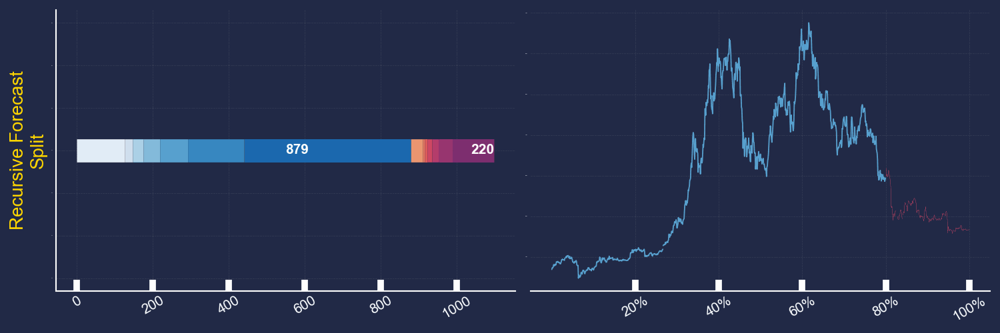

In [8]:
Image('../Forecast_Prices/Animation/plot_bars_lines.gif')

In [10]:
#Plots.Plot_Train_Test_Splits(dataframe=df)

In [12]:
#Plots.Characteristics_of_Model(model=lr)

In [12]:
lr.feature_names_in_[lr.coef_ >= 1038.4696621945163]

array(['ADABUSD_Low', 'ADABUSD_Close', 'XRPBUSD_Open', 'XRPBUSD_Close',
       'VETBUSD_Open', 'TRXBUSD_Open', 'TRXBUSD_Low', 'XLMBUSD_High'],
      dtype=object)

In [13]:
lr.feature_names_in_[lr.coef_ <= -1067.1638944579051]

array(['ADABUSD_Open', 'ADABUSD_High', 'XRPBUSD_Low', 'VETBUSD_High',
       'VETBUSD_Low', 'VETBUSD_Close', 'TRXBUSD_High', 'TRXBUSD_Close',
       'XLMBUSD_Low', 'XLMBUSD_Close'], dtype=object)

# Binance

In [24]:
df = pd.read_csv("../Forecast_Prices/Data/Binance_Data_Crypto/Binance_Crypto_Data.csv", index_col="Open time")
df
#Plots.Plot_Of_Missing_Data(dataframe=df)
#Plots.Plot_Of_Missing_Data(dataframe=df[df.index >= '2020-08-01'])
#df = Preprocessing.Drop_Big_NullSum_Columns(dataframe=df)
#df = Preprocessing.Keep_Specific_Columns(dataframe=df)

,ETHBTC_Open,ETHBTC_High,ETHBTC_Low,ETHBTC_Close,LTCBTC_Open,LTCBTC_High,LTCBTC_Low,LTCBTC_Close,BNBBTC_Open,BNBBTC_High,...,RENDERTRY_Low,RENDERTRY_Close,RENDEREUR_Open,RENDEREUR_High,RENDEREUR_Low,RENDEREUR_Close,RENDERBRL_Open,RENDERBRL_High,RENDERBRL_Low,RENDERBRL_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0.017954,0.018356,0.017920,0.018150,0.005739,0.005812,0.005729,0.005779,0.001907,0.001918,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-02,0.018152,0.018319,0.017965,0.018256,0.005777,0.005806,0.005626,0.005660,0.001905,0.001905,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-03,0.018257,0.018425,0.017800,0.018297,0.005660,0.005754,0.005585,0.005750,0.001867,0.001907,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-04,0.018298,0.018360,0.018140,0.018248,0.005747,0.005828,0.005713,0.005818,0.001859,0.001887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-05,0.018247,0.018565,0.018152,0.018400,0.005817,0.005970,0.005740,0.005884,0.001876,0.001917,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-27,0.052470,0.055110,0.052350,0.054770,0.001723,0.001802,0.001711,0.001748,0.007002,0.007472,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-28,0.054770,0.056220,0.054760,0.055070,0.001750,0.001809,0.001732,0.001797,0.007463,0.007893,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-29,0.055080,0.055550,0.054340,0.054650,0.001799,0.001829,0.001739,0.001741,0.007581,0.007660,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
#Plots.Plot_Of_Missing_Data(dataframe=df)

In [26]:
#df.to_csv('./Data/Binance_Data_Crypto/Binance_Filter_Crypto_Data.csv', index=True)
df = Preprocessing.Drop_Big_NullSum_Columns(dataframe=df)
df

--- Start Drop_Big_NullSum_Columns()
.
 Drop > 12% null columns length of dataframe
.
--- End  Drop_Big_NullSum_Columns()



,ETHBTC_Open,ETHBTC_High,ETHBTC_Low,ETHBTC_Close,LTCBTC_Open,LTCBTC_High,LTCBTC_Low,LTCBTC_Close,BNBBTC_Open,BNBBTC_High,...,DGBBTC_Low,DGBBTC_Close,BTCUAH_Open,BTCUAH_High,BTCUAH_Low,BTCUAH_Close,USDTUAH_Open,USDTUAH_High,USDTUAH_Low,USDTUAH_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0.017954,0.018356,0.017920,0.018150,0.005739,0.005812,0.005729,0.005779,0.001907,0.001918,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-02,0.018152,0.018319,0.017965,0.018256,0.005777,0.005806,0.005626,0.005660,0.001905,0.001905,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-03,0.018257,0.018425,0.017800,0.018297,0.005660,0.005754,0.005585,0.005750,0.001867,0.001907,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-04,0.018298,0.018360,0.018140,0.018248,0.005747,0.005828,0.005713,0.005818,0.001859,0.001887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-05,0.018247,0.018565,0.018152,0.018400,0.005817,0.005970,0.005740,0.005884,0.001876,0.001917,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-27,0.052470,0.055110,0.052350,0.054770,0.001723,0.001802,0.001711,0.001748,0.007002,0.007472,...,2.200000e-07,2.300000e-07,1812684.0,1850000.0,1794336.0,1836121.0,42.61,42.63,42.25,42.27
2023-12-28,0.054770,0.056220,0.054760,0.055070,0.001750,0.001809,0.001732,0.001797,0.007463,0.007893,...,2.200000e-07,2.200000e-07,1840822.0,1845536.0,1788041.0,1814672.0,42.27,42.57,42.19,42.52
2023-12-29,0.055080,0.055550,0.054340,0.054650,0.001799,0.001829,0.001739,0.001741,0.007581,0.007660,...,2.200000e-07,2.200000e-07,1815596.0,1830500.0,1770672.0,1791343.0,42.53,42.84,42.28,42.57


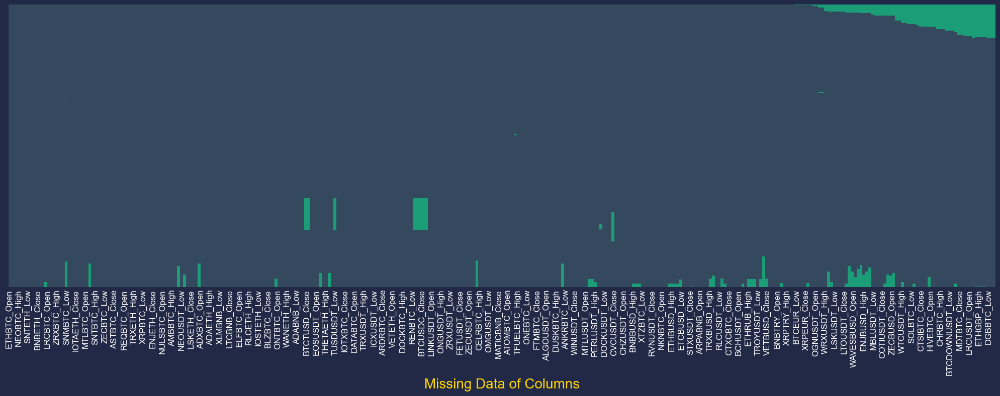

In [27]:
Plots.Plot_Of_Missing_Data(dataframe=df)

In [28]:
#df.to_csv('../Forecast_Prices//Data/Binance_Data_Crypto/Binance_Filter_Crypto_Data.csv')

In [139]:
lr = LinearRegression()

In [4]:
df = pd.read_csv("../Forecast_Prices/Data/Binance_Data_Crypto/Binance_Filter_Crypto_Data.csv", index_col="Open time")
df

,ETHBTC_Open,ETHBTC_High,ETHBTC_Low,ETHBTC_Close,LTCBTC_Open,LTCBTC_High,LTCBTC_Low,LTCBTC_Close,BNBBTC_Open,BNBBTC_High,...,DGBBTC_Low,DGBBTC_Close,BTCUAH_Open,BTCUAH_High,BTCUAH_Low,BTCUAH_Close,USDTUAH_Open,USDTUAH_High,USDTUAH_Low,USDTUAH_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0.017954,0.018356,0.017920,0.018150,0.005739,0.005812,0.005729,0.005779,0.001907,0.001918,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-02,0.018152,0.018319,0.017965,0.018256,0.005777,0.005806,0.005626,0.005660,0.001905,0.001905,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-03,0.018257,0.018425,0.017800,0.018297,0.005660,0.005754,0.005585,0.005750,0.001867,0.001907,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-04,0.018298,0.018360,0.018140,0.018248,0.005747,0.005828,0.005713,0.005818,0.001859,0.001887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-05,0.018247,0.018565,0.018152,0.018400,0.005817,0.005970,0.005740,0.005884,0.001876,0.001917,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-27,0.052470,0.055110,0.052350,0.054770,0.001723,0.001802,0.001711,0.001748,0.007002,0.007472,...,2.200000e-07,2.300000e-07,1812684.0,1850000.0,1794336.0,1836121.0,42.61,42.63,42.25,42.27
2023-12-28,0.054770,0.056220,0.054760,0.055070,0.001750,0.001809,0.001732,0.001797,0.007463,0.007893,...,2.200000e-07,2.200000e-07,1840822.0,1845536.0,1788041.0,1814672.0,42.27,42.57,42.19,42.52
2023-12-29,0.055080,0.055550,0.054340,0.054650,0.001799,0.001829,0.001739,0.001741,0.007581,0.007660,...,2.200000e-07,2.200000e-07,1815596.0,1830500.0,1770672.0,1791343.0,42.53,42.84,42.28,42.57


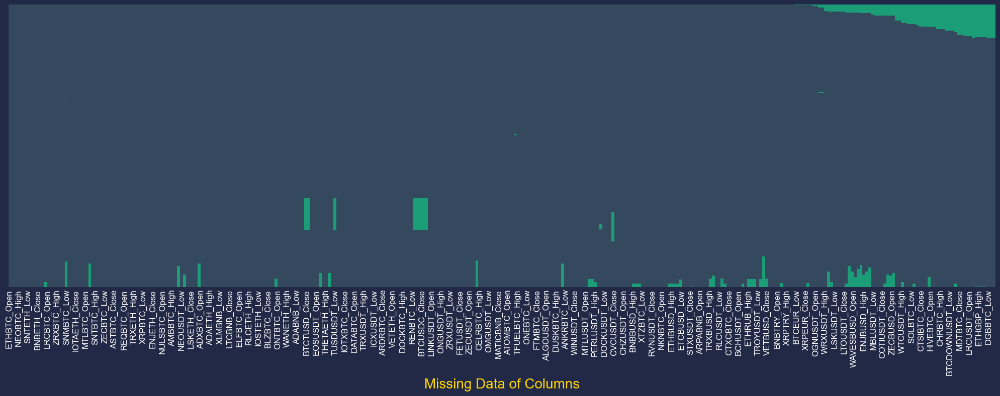

In [5]:
Plots.Plot_Of_Missing_Data(dataframe=df)

---

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  283
--- End Correlation()


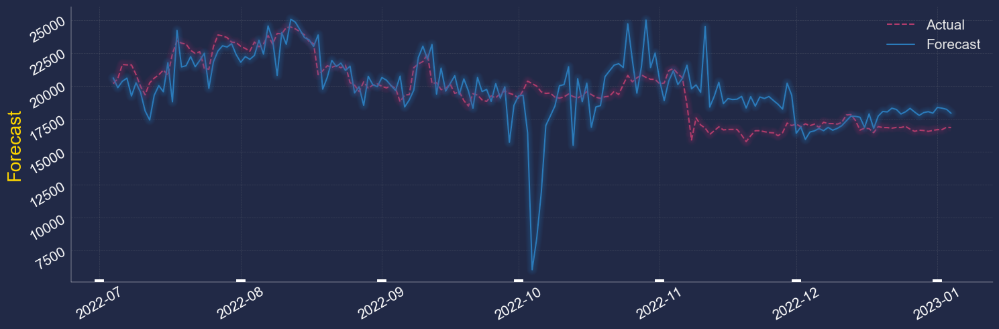

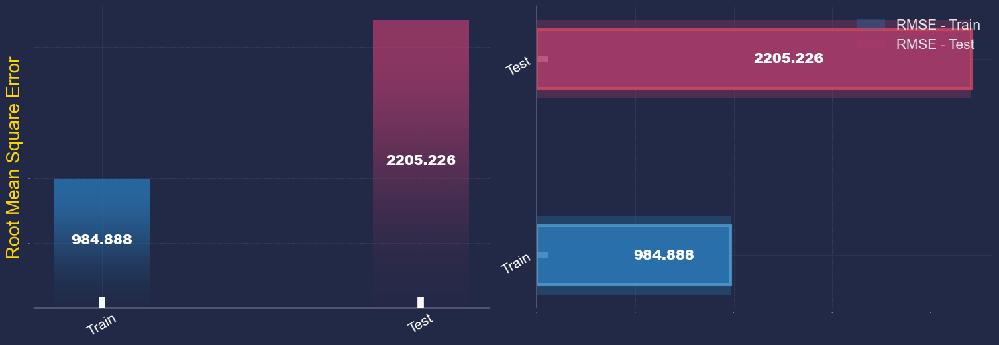

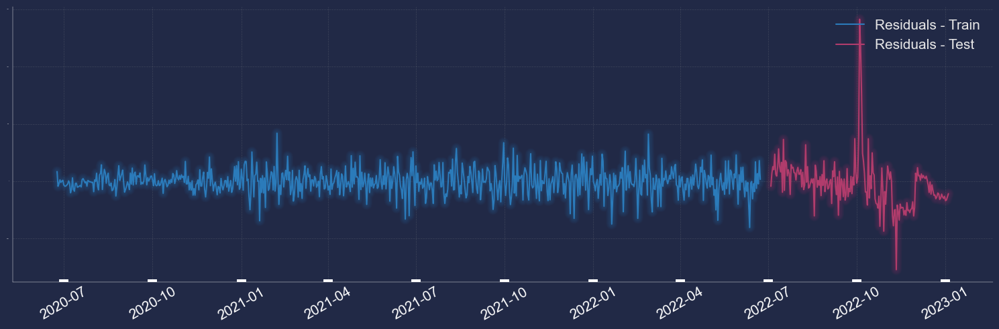

In [7]:
df1 = df.copy()

df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)

df1 = df1[df1.index <= '2023-01-05']
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  380
--- End Correlation()


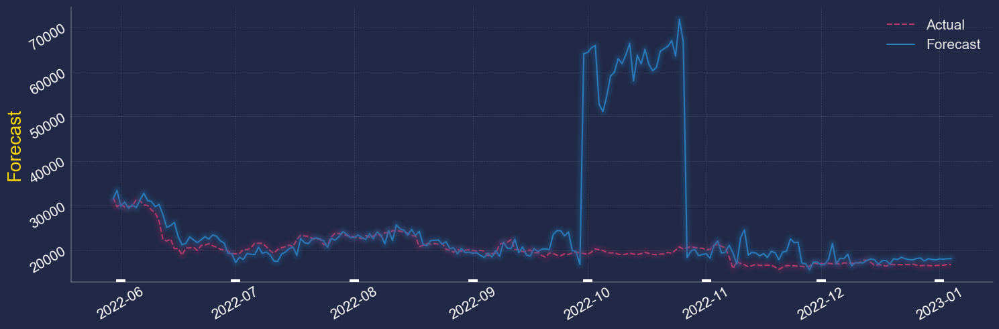

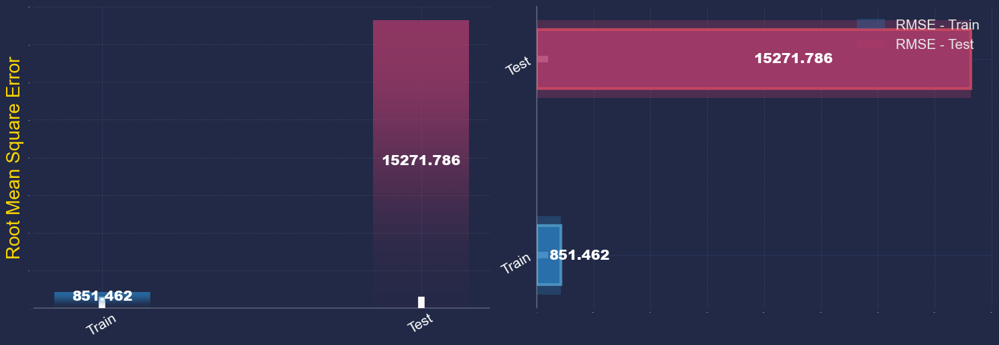

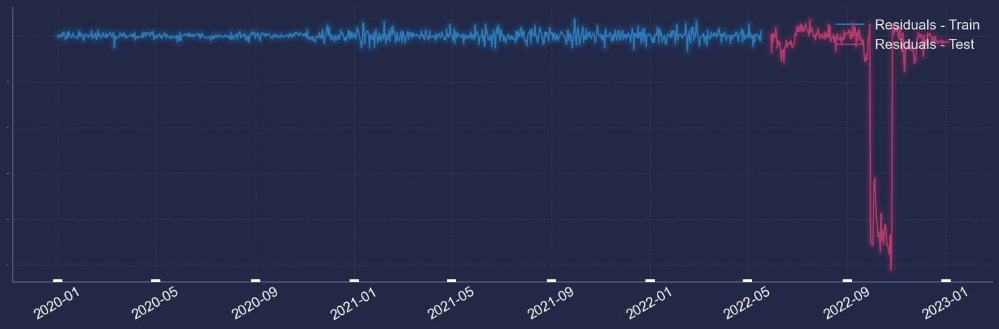

In [8]:
df1 = df.copy()

df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)

df1 = df1[df1.index <= '2023-01-05']
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Drop_Holidays_Values()
.
.
--- End Drop_Holidays_Values()
--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  283
--- End Correlation()


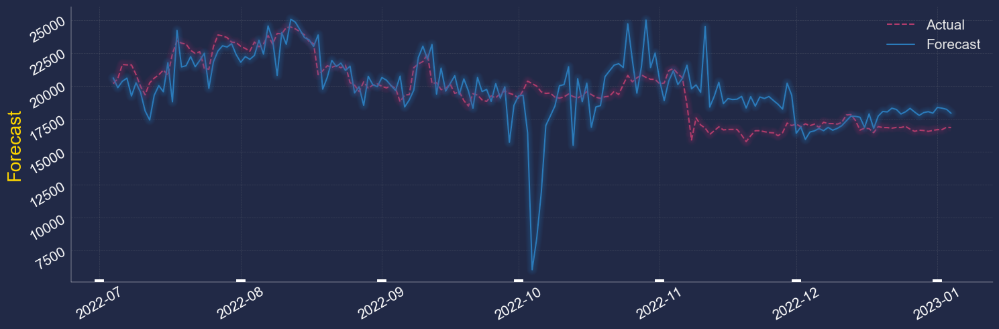

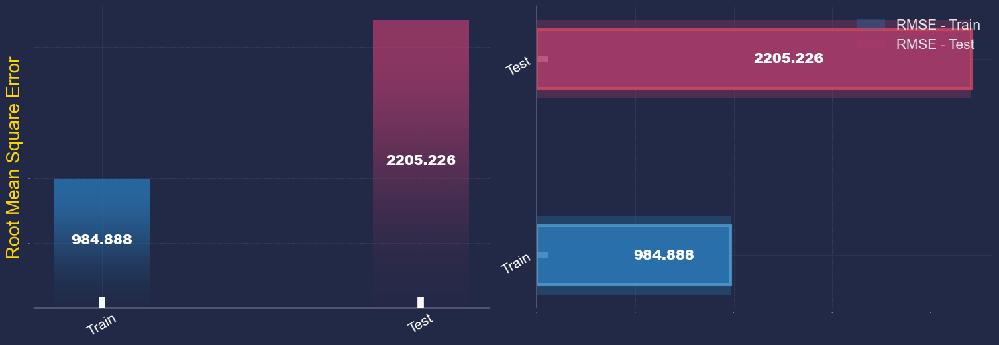

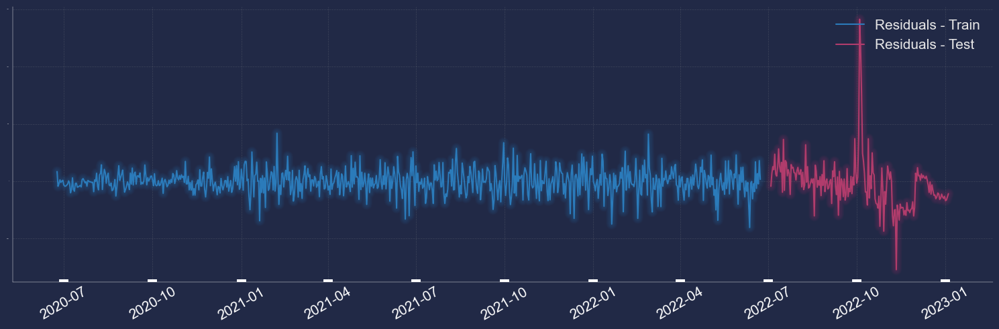

In [9]:
df1 = df.copy()

df1 = Preprocessing.Drop_Holidays_Values(dataframe=df1)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)

df1 = df1[df1.index <= '2023-01-05']
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Drop_Holidays_Values()
.
.
--- End Drop_Holidays_Values()
--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  380
--- End Correlation()


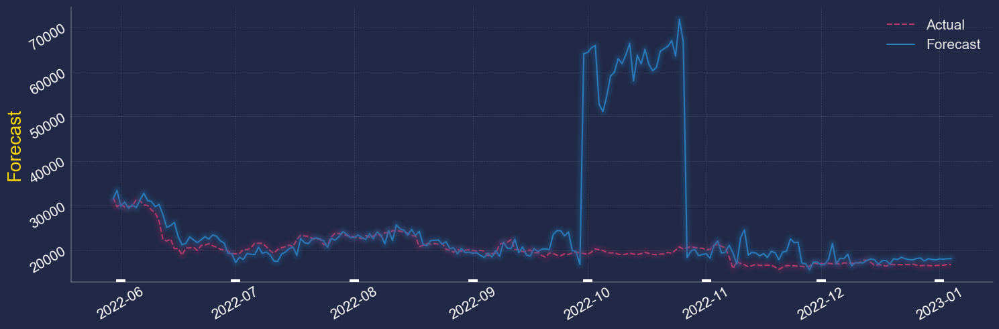

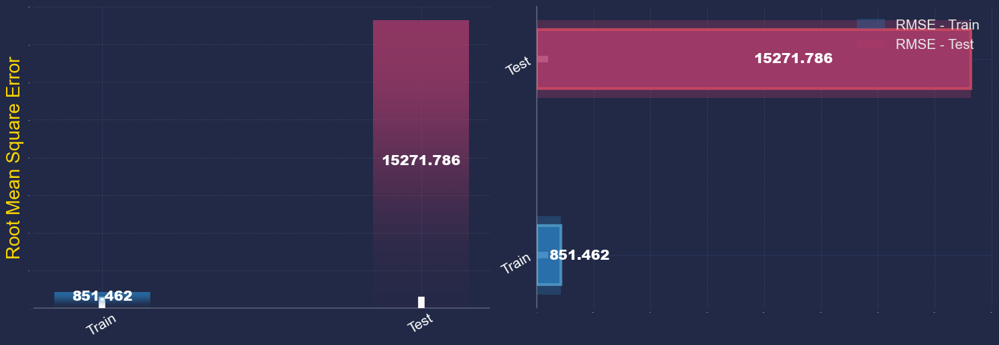

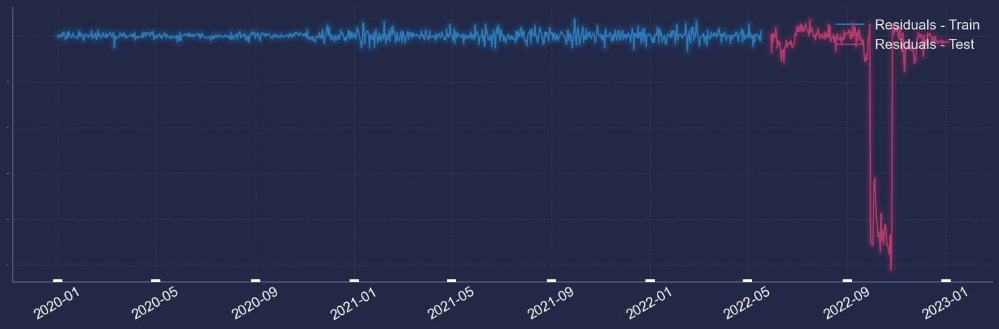

In [10]:
df1 = df.copy()

df1 = Preprocessing.Drop_Holidays_Values(dataframe=df1)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = df1[df1.index <= '2023-01-05']
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

---

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  163
--- End Correlation()


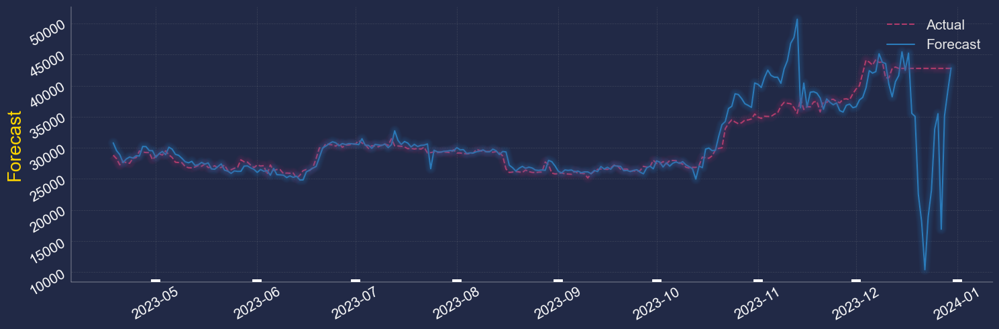

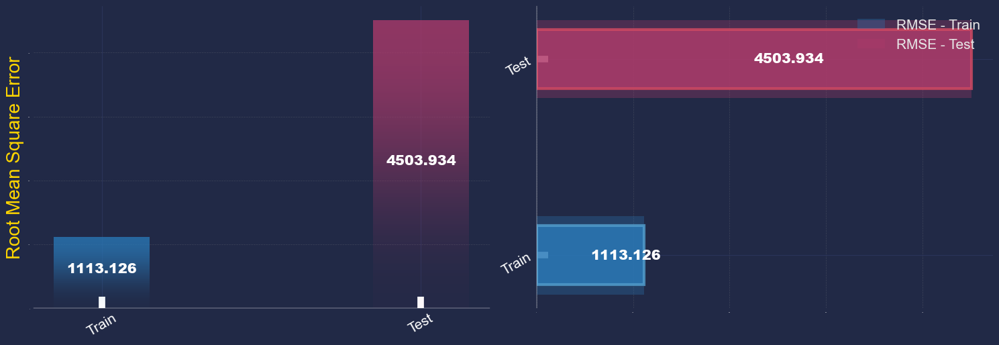

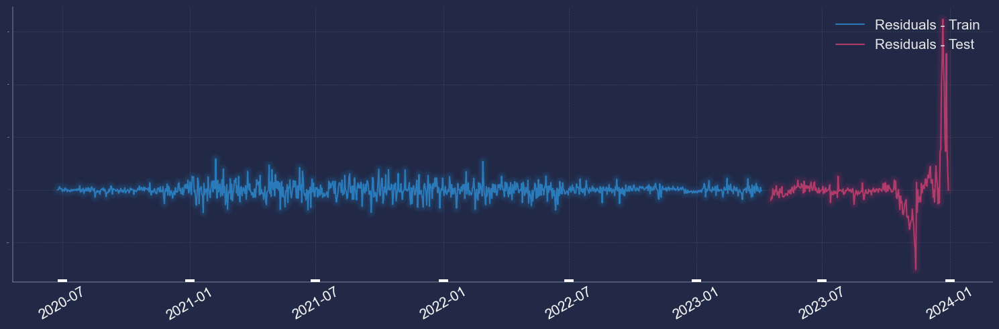

In [11]:
df1 = df.copy()

df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  338
--- End Correlation()


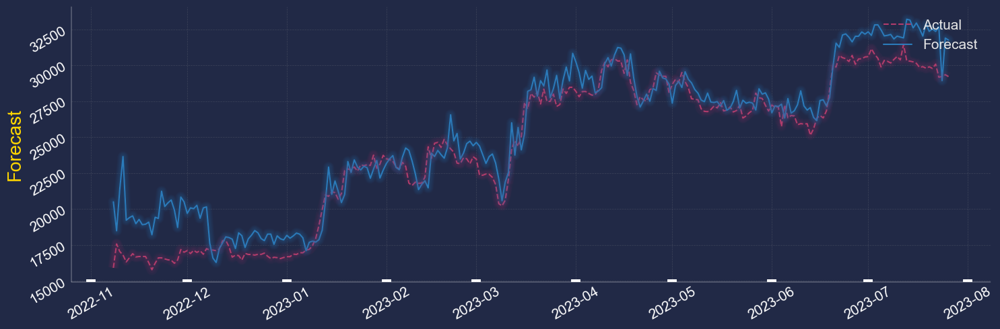

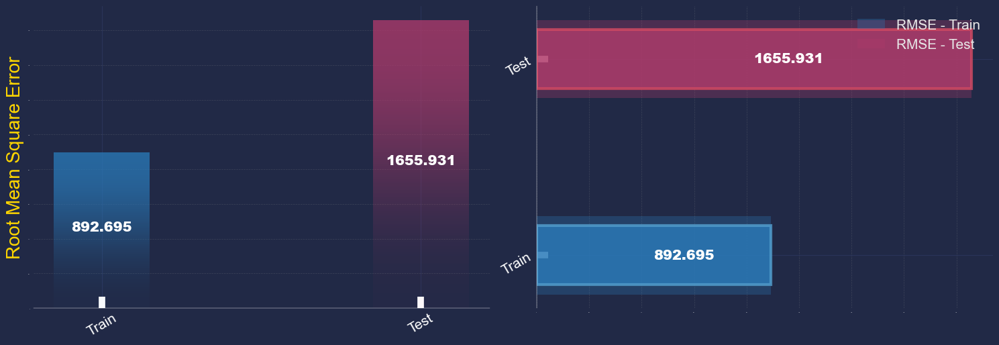

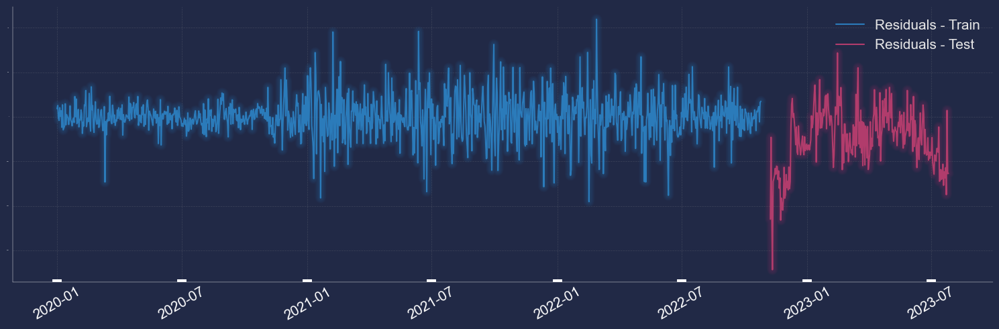

In [12]:
df1 = df.copy()

df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Drop_Holidays_Values()
.
.
--- End Drop_Holidays_Values()
--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  163
--- End Correlation()


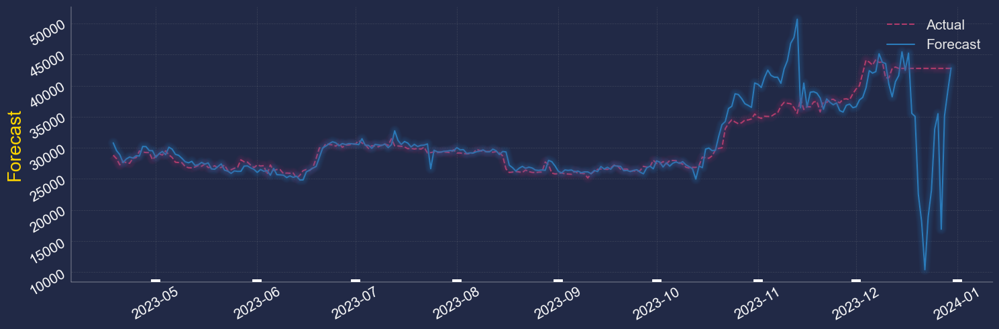

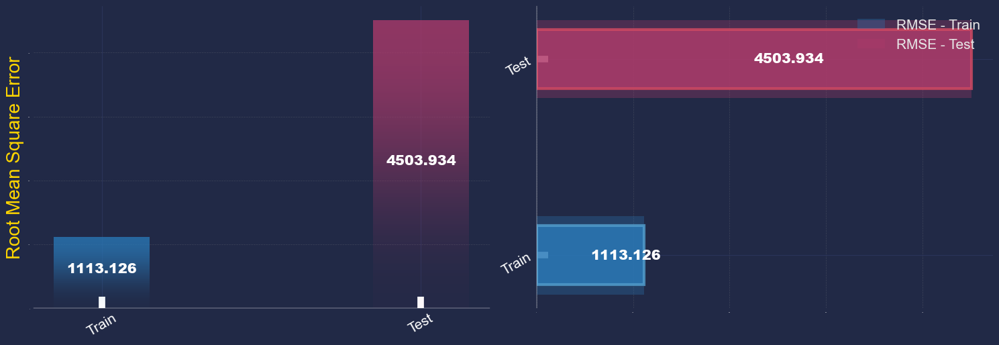

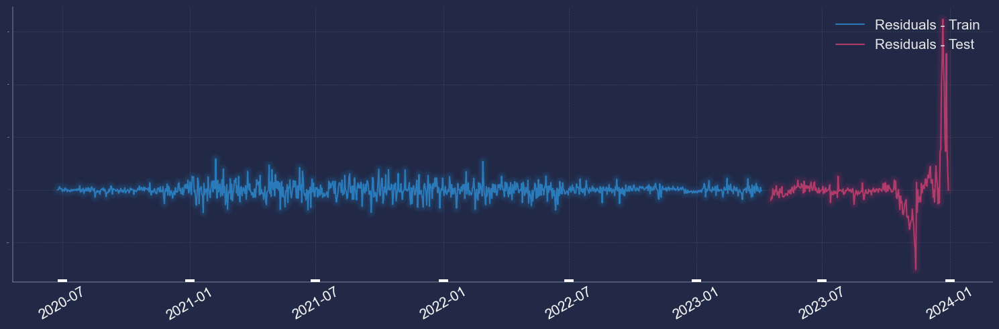

In [14]:
df1 = df.copy()

df1 = Preprocessing.Drop_Holidays_Values(dataframe=df1)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Drop_Holidays_Values()
.
.
--- End Drop_Holidays_Values()
--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  338
--- End Correlation()


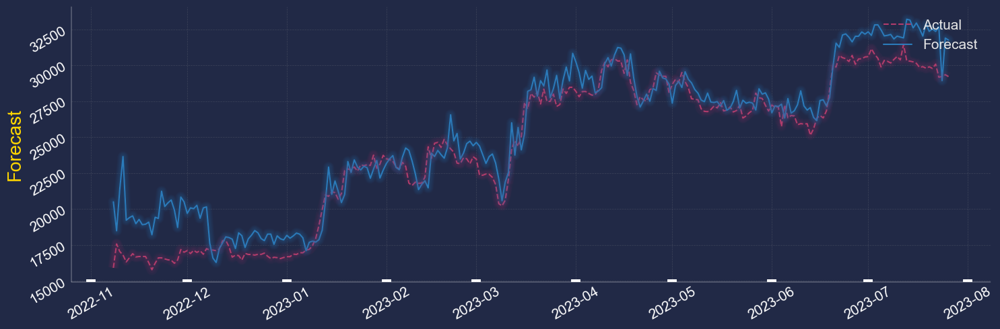

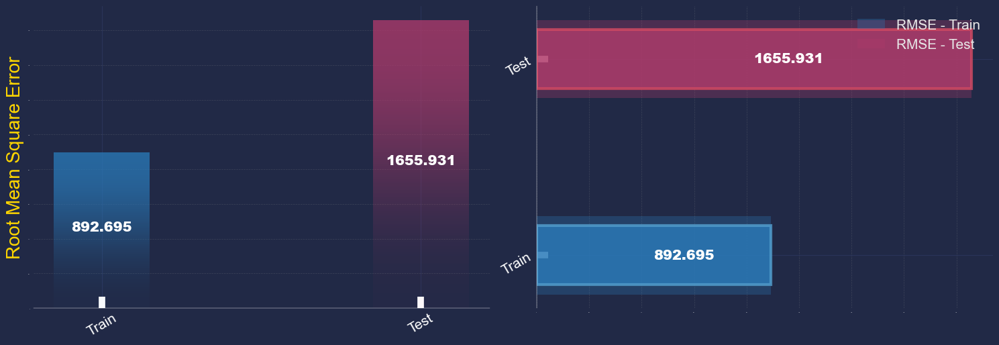

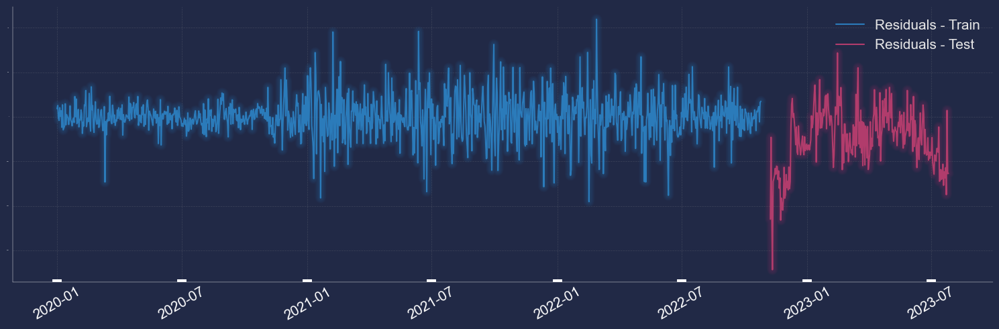

In [15]:
df1 = df.copy()

df1 = Preprocessing.Drop_Holidays_Values(dataframe=df1)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)


---

In [54]:
def Recursive_Forecast_Plot_Split(dataframe, model):
    '''
    This function visualize 3 plots with Recursive Forecast method
    1) Actual and Forecast Price
    2) The Metric of Forecast (RMSE)
    3) The Residuals of Forecast
    ------------------------------
    Parameter(dataframe): DataFrame
    Parameter(model): A Model (With parameters or not)
    ------------------------------
    '''
    
    try:
        prediction = [] #Create a list value
    
        X = dataframe.iloc[:, 1:]
        y = dataframe.iloc[:, 0]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False) #80% X_train - 20% X_test
    
        Xtrain = X_train.copy()
        Xtest = X_test.copy()
        ytrain = y_train.copy()
        ytest = y_test.copy()

        model_train_predict = model.fit(Xtrain, ytrain) #Fit the model

        #------------ Plot 1,4 ------------#
        index = y_train.index.copy()
        index = pd.to_datetime(index) #y_test index
        
        forecast_index = y_test.index.copy()
        forecast_index = pd.to_datetime(forecast_index) #y_test index
        #------------ Plot 1,4 ------------#
        #print(len(index))
        #print(len(model_train_predict))
        #print(model_train_predict)
        #------------ Drop the Xtest rows and Fit again the Xtrain ------------#
        while len(Xtest) > 0:    
            if len(Xtest) >= 30:
            
                model.fit(Xtrain, ytrain) #Fit the model
                forecast = model.predict(Xtest.iloc[0:30]).tolist() #Predict the days
                prediction = prediction + forecast #Insert the forecast values in prediction
        
                Xtrain = pd.concat([Xtrain, Xtest.iloc[0:30]]) #Insert values from second dataframe to first
                ytrain = pd.concat([ytrain, ytest.iloc[0:30]]) #Insert values from second dataframe to first
        
                Xtest.drop(Xtest.index[range(30)], inplace=True) #Drop Rows
                ytest.drop(ytest.index[range(30)], inplace=True) #Drop Rows

            else:
                forecast = model.predict(Xtest).tolist() #Predict the days
                prediction = prediction + forecast #Insert the forecast values in prediction
                break;
    #------------ Drop the Xtest rows and Fit again the Xtrain ------------#
    
    #print('X_train: ', X_train.shape, '\nXtrain: ', Xtrain.shape, '\n\n',
    #      'y_train: ', y_train.shape, '\nytrain: ', ytrain.shape)
    #print()
    #print('X_test: ', X_test.shape, '\nXtest: ', Xtest.shape, '\n\n',
    #      'y_test: ', y_test.shape, '\nytest: ', ytest.shape)
    #print()
    #print('Prediction: ', len(prediction))
    
        plt.style.use("cyberpunk") #Background color
        pal_red = sns.color_palette("flare") #Color
        pal_blue = sns.color_palette("Blues") #Color
    
#------------------------------------------------------------------------------------------------------------------------------#
    
        #------------ Plot 1 ------------#
        fig, ax1 = plt.subplots(figsize=(15,5), tight_layout=True) #Size of plot dpi=300 for better quality

        ax1.plot(index, y_train, label='AAA', color=pal_red[0])
        #ax1.plot(index, model_train_predict, color=pal_blue[0])

        ax1.plot(forecast_index, y_test, ls='--', label='OOO', color=pal_red[3])
        ax1.plot(forecast_index, prediction, label='III', color=pal_blue[4])

        plt.ylabel('Forecast', fontsize=20, color='Gold') #Bottom title
        #plt.legend(['Actual','Forecast'], loc="upper right", fontsize=15) #Label - Size of plot
        plt.tick_params(axis='x', labelrotation=30, labelsize=15, width=10, length=3,  direction="in", colors='White') #Rotation label x and y
        plt.tick_params(axis='y', labelrotation=30, labelsize=15, colors='White') #Rotation label x and y
        plt.grid(zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot

        mplcp.make_lines_glow()
        #mplcp.make_lines_glow(alpha_line=0.5, n_glow_lines=10,  diff_linewidth=1.05) #Glow - Effect lines

        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.spines['left'].set_color('White')
        ax1.spines['left'].set_linewidth(0.3)
        ax1.spines['bottom'].set_color('White')
        ax1.spines['bottom'].set_linewidth(0.3)
        plt.show()
        #------------ Plot 1 ------------#
    
#------------------------------------------------------------------------------------------------------------------------------#



#------------------------------------------------------------------------------------------------------------------------------#
    
        #------------ Plot 2,3 ------------#
        metric_train = model.predict(X=Xtrain).tolist()
    
        Train_MSE = mean_squared_error(ytrain, metric_train)
        Train_RMSE = math.sqrt(Train_MSE)
        Train_RMSE = round(Train_RMSE,3)
        
        Test_MSE = mean_squared_error(y_test, prediction)
        Test_RMSE = math.sqrt(Test_MSE)
        Test_RMSE = round(Test_RMSE,3)

        Metric_data = pd.DataFrame(data={'Train' : [Train_RMSE],
                                         'Test' : [Test_RMSE]})
        #Metric_data.astype(float)
    
        fig = gridspec.GridSpec(3, 2)
        pl.figure(figsize=(15, 15), tight_layout=True)

        ax2 = pl.subplot(fig[0, 0])
        plt.ylabel('Root Mean Square Error', fontsize=20, color='Gold') #Bottom title
    
        bar1 = ax2.bar(Metric_data.columns[0], Metric_data['Train'], width=0.3, linewidth=3, alpha=0.8, bottom=0, edgecolor=pal_blue[3], color=pal_blue[4])
        bar2 = ax2.bar(Metric_data.columns[1], Metric_data['Test'], width=0.3, linewidth=3, alpha=0.8, bottom=0, edgecolor=pal_red[2], color=pal_red[3])
    
        ax2.tick_params(axis='x', width=7, length=12, labelrotation=30, labelsize=15, bottom=True, direction="in", colors='White') #White
        ax2.tick_params(axis='y', labelsize=0) #White
        #ax2.tick_params(axis='y', labelsize=0) #Rotation label x and y
        #ax2.tick_params(axis='y', labelrotation=30, labelsize=15, left=False, colors='White') #White
        ax2.tick_params(axis='x', width=7, length=12, labelrotation=30, labelsize=15, bottom=True, direction="in", left=False, colors='White') #White
        ax2.grid(axis='y', zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot

        ax2.text(x=Metric_data.Train.name, y=Metric_data.Train.sum()/2, s=Metric_data.Train[0], color='White', weight='extra bold', ha='center', fontsize=15) #Text of labels
        ax2.text(x=Metric_data.Test.name, y=Metric_data.Test.sum()/2, s=Metric_data.Test[0], color='White', weight='extra bold', ha='center', fontsize=15) #Text of labels

        mplcp.add_bar_gradient(bars=bar1)
        mplcp.add_bar_gradient(bars=bar2)
    
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.spines['left'].set_visible(False)
        ax2.spines['bottom'].set_color('White')
        ax2.spines['bottom'].set_linewidth(0.3)



        ax3 = pl.subplot(fig[0, 1])
        
        ax3.barh(Metric_data.columns[0], Metric_data['Train']+0.1, height=0.4, linewidth=3, alpha=0.3, left=0, color=pal_blue[4])
        ax3.barh(Metric_data.columns[1], Metric_data['Test']+0.1, height=0.4, linewidth=3, alpha=0.3, left=0, color=pal_red[3])
    
        ax3.barh(Metric_data.columns[0], Metric_data['Train'], height=0.3, linewidth=3, alpha=0.8, left=0, edgecolor=pal_blue[3], color=pal_blue[4])
        ax3.barh(Metric_data.columns[1], Metric_data['Test'], height=0.3, linewidth=3, alpha=0.8, left=0, edgecolor=pal_red[2], color=pal_red[3])
    
        ax3.legend(['RMSE - Train','RMSE - Test'], loc="upper right", fontsize=15) #Label - Size of plot
        ax3.tick_params(axis='y', width=7, length=12, labelrotation=30, labelsize=15, left=True, bottom=False, direction="in", colors='White')
        ax3.tick_params(axis='x', labelsize=0) #Rotation label x and y
        ax3.grid(axis='x', zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot
        #ax3.tick_params(axis='x', labelrotation=30, labelsize=15, bottom=False, colors='White')

        ax3.text(x=Metric_data.Train.sum()/2, y=Metric_data.Train.name, s=Metric_data.Train[0], color='White', weight='extra bold', va='center', fontsize=15) #Text of labels
        ax3.text(x=Metric_data.Test.sum()/2, y=Metric_data.Test.name, s=Metric_data.Test[0], color='White', weight='extra bold', va='center', fontsize=15) #Text of labels
    
        ax3.spines['top'].set_visible(False)
        ax3.spines['right'].set_visible(False)
        ax3.spines['bottom'].set_visible(False)
        ax3.spines['left'].set_color('White')
        ax3.spines['left'].set_linewidth(0.3)
        plt.show()
        #------------ Plot 2,3 ------------#
    
#------------------------------------------------------------------------------------------------------------------------------#



#------------------------------------------------------------------------------------------------------------------------------#
    
        length_of_dataframe = int(len(dataframe) * 0.79)

        #------------ Plot 4 ------------#
        Residuals_Train = ytrain - metric_train
        Residuals_Test = y_test - prediction
    
        Residuals_data_train = pd.DataFrame(data={'Residuals_Train' : Residuals_Train})
        Residuals_data_test = pd.DataFrame(data={'Residuals_Test' : Residuals_Test})

        residuals_index_train = Residuals_data_train.index.copy()
        residuals_index_train = pd.to_datetime(residuals_index_train) #Residuals intex train
    
        fig, ax4 = plt.subplots(figsize=(15,5), tight_layout=True) #Size of plot dpi=300 for better quality

        ax4.plot(residuals_index_train[0:length_of_dataframe], Residuals_data_train.Residuals_Train[0:length_of_dataframe], color=pal_blue[4])
        ax4.plot(forecast_index, Residuals_data_test.Residuals_Test.values, color=pal_red[3])
        ax4.legend(['Residuals - Train','Residuals - Test'], loc="upper right", fontsize=15) #Label - Size of plot

        ax4.tick_params(axis='x', labelrotation=30, labelsize=15, width=10, length=3, direction="in", colors='White') #Rotation label x and y
        ax4.tick_params(axis='y', labelsize=0) #White
        #ax4.tick_params(axis='y', labelrotation=30, labelsize=15, colors='White') #Rotation label x and y
        ax4.grid(zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot
    
        mplcp.make_lines_glow()

        ax4.spines['top'].set_visible(False)
        ax4.spines['right'].set_visible(False)
        ax4.spines['left'].set_color('White')
        ax4.spines['left'].set_linewidth(0.3)
        ax4.spines['bottom'].set_color('White')
        ax4.spines['bottom'].set_linewidth(0.3)
        plt.show()
        #------------ Plot 4 ------------#
    except:
        print('No option!\nError')

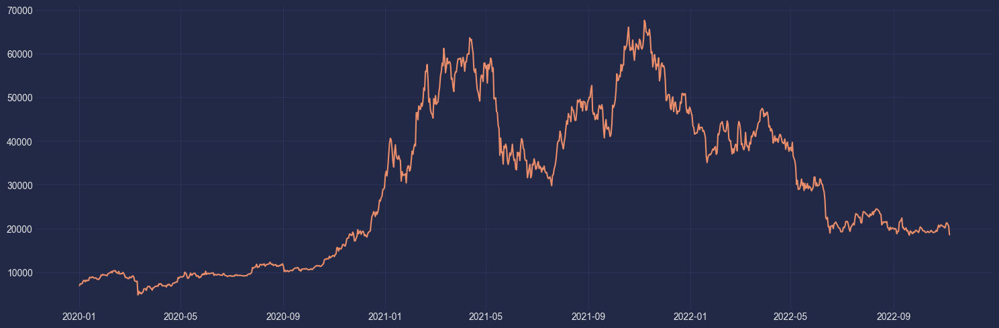

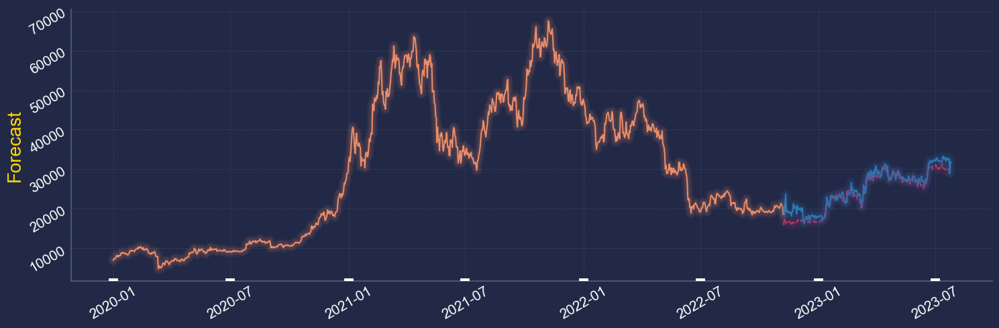

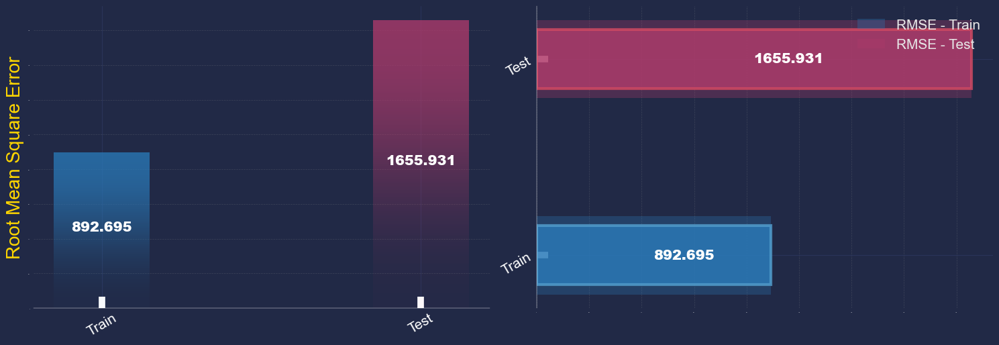

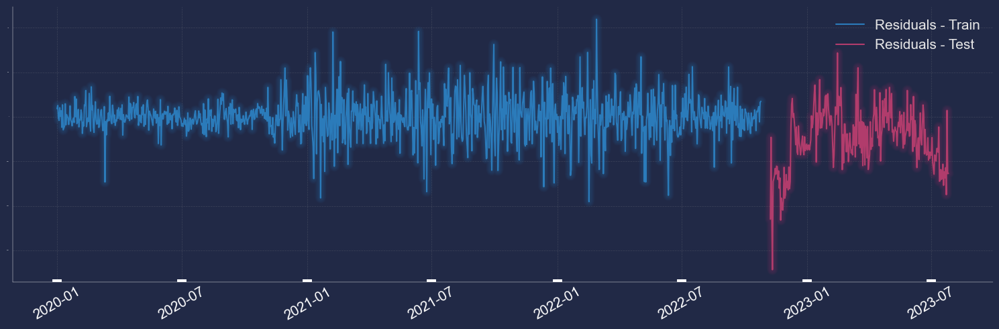

In [55]:
Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

In [70]:
df1 = df.copy()

df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCUAH_Open')
#df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Open')
#df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')

X = df1.iloc[:, 1:]
Y = df1.iloc[:, 0]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, shuffle=False)  # 80% X_train - 20% X_test

--- Start Select_Target()
.
Target:  BTCUAH_Open 
.
--- End Select_Target()



In [71]:
lr.fit(X_train,y_train)
lr_pred = lr.predict(X_test)

In [72]:
data = pd.DataFrame(y_test)
data['Forecast'] = lr_pred
data

,Target_BTCUAH_Open,Forecast
Open time,,
2022-06-16,722491.0,7.148552e+05
2022-06-17,728311.0,7.207733e+05
2022-06-18,672338.0,6.861070e+05
2022-06-19,725340.0,7.399991e+05
2022-06-20,721212.0,7.304581e+05
...,...,...
2023-07-22,1149107.0,1.149544e+06
2023-07-23,1157905.0,1.151250e+06
2023-07-24,1122637.0,1.138132e+06


<Figure size 1600x800 with 0 Axes>

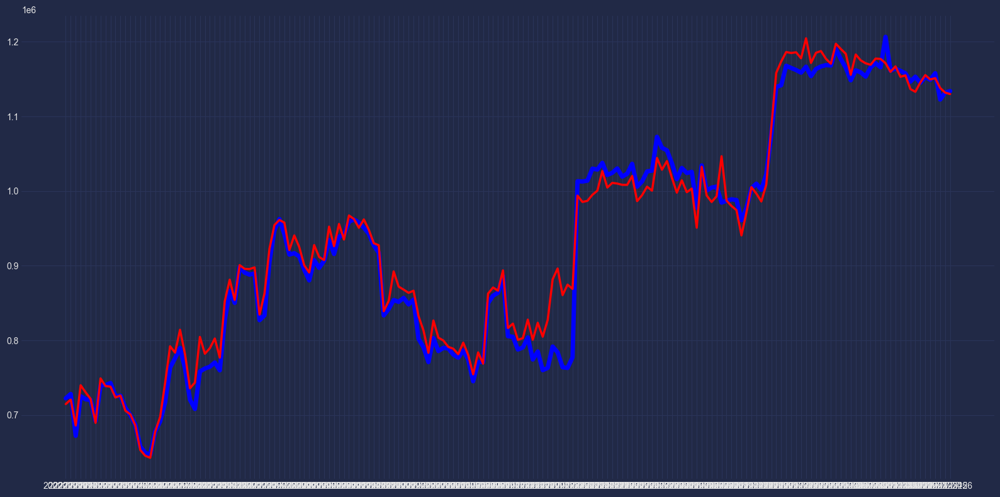

In [74]:
plt.figure(figsize=(16, 8),  tight_layout=True)

plt.plot(data.index, data['Target_BTCUAH_Open'], linewidth=5, color='Blue')
plt.plot(data.index, data['Forecast'], linewidth=2.5, color='Red')

plt.show()

In [75]:
df1

,Target_BTCUAH_Open,ETHBTC_Open,ETHBTC_High,ETHBTC_Low,ETHBTC_Close,LTCBTC_Open,LTCBTC_High,LTCBTC_Low,LTCBTC_Close,BNBBTC_Open,...,DGBBTC_Low,DGBBTC_Close,BTCUAH_Open,BTCUAH_High,BTCUAH_Low,BTCUAH_Close,USDTUAH_Open,USDTUAH_High,USDTUAH_Low,USDTUAH_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-06-24,245427.0,0.025264,0.025820,0.025041,0.025233,0.004591,0.004624,0.004545,0.004585,0.001703,...,1.970000e-06,2.030000e-06,256746.0,256746.0,24999.0,247024.0,26.660,26.660,5.500,26.553
2020-06-25,245755.0,0.025233,0.025347,0.025087,0.025136,0.004585,0.004643,0.004554,0.004580,0.001721,...,2.000000e-06,2.080000e-06,245427.0,250410.0,241900.0,246098.0,26.596,26.738,26.510,26.698
2020-06-26,241593.0,0.025137,0.025222,0.025019,0.025065,0.004581,0.004730,0.004544,0.004702,0.001720,...,2.000000e-06,2.040000e-06,245755.0,246265.0,239439.0,243325.0,26.700,26.709,26.355,26.665
2020-06-27,239205.0,0.025062,0.025162,0.024158,0.024516,0.004704,0.004713,0.004418,0.004556,0.001721,...,1.920000e-06,2.000000e-06,241593.0,244469.0,237674.0,240156.0,26.400,26.661,26.400,26.661
2020-06-28,241099.0,0.024514,0.024822,0.024400,0.024670,0.004556,0.004592,0.004517,0.004536,0.001679,...,1.950000e-06,2.190000e-06,239205.0,244274.0,237488.0,242707.0,26.531,26.670,26.402,26.600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-22,1149107.0,0.063250,0.063400,0.062410,0.062650,0.003147,0.003218,0.003081,0.003092,0.008149,...,2.600000e-07,2.700000e-07,1152924.0,1155884.0,1144592.0,1147275.0,38.510,38.590,38.410,38.540
2023-07-23,1157905.0,0.062640,0.062930,0.062500,0.062790,0.003091,0.003109,0.003078,0.003098,0.008092,...,2.600000e-07,2.700000e-07,1149107.0,1167311.0,1148323.0,1158207.0,38.540,38.550,38.430,38.540
2023-07-24,1122637.0,0.062790,0.063580,0.062720,0.063400,0.003097,0.003128,0.003015,0.003056,0.008058,...,2.600000e-07,2.700000e-07,1157905.0,1159064.0,1116753.0,1127294.0,38.530,38.840,38.440,38.650


In [10]:
df1 = df.copy()
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Open')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Open', number=0.9)

--- Start Select_Target()
.
Target:  BTCBUSD_Open 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.9  -  0.9 )
Length of Dataframe is:  37
--- End Correlation()


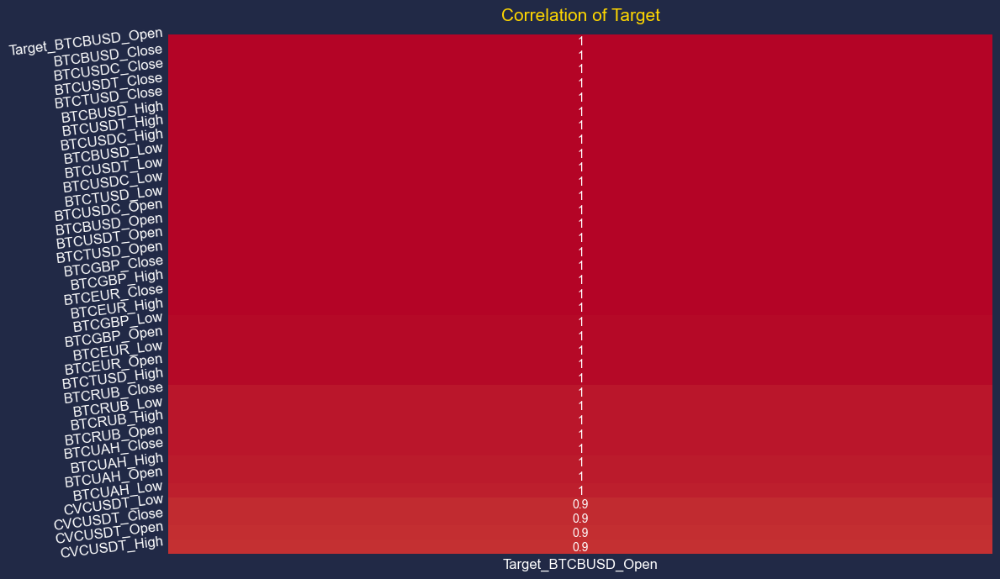

In [11]:
Plots.Plot_Of_Correlation(dataframe=df1)

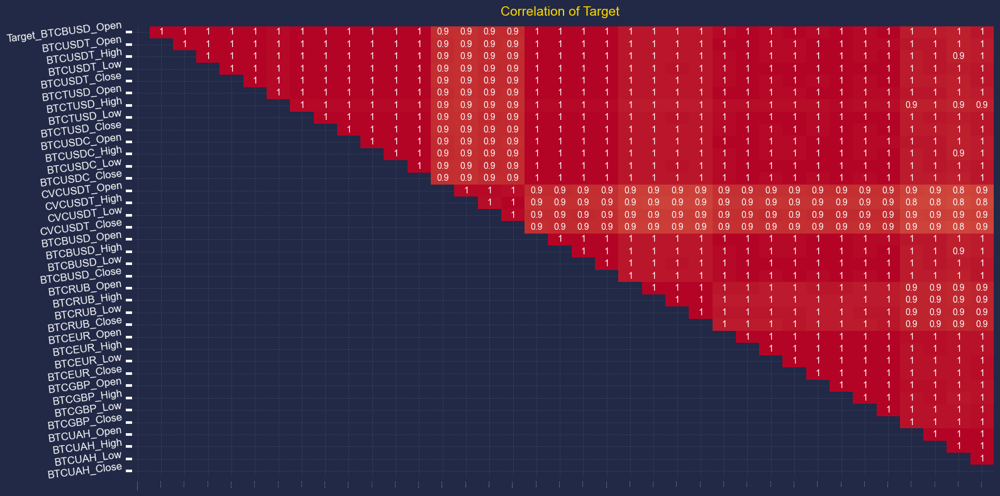

In [12]:
Plots.Plot_Of_Matrix_Correlation(dataframe=df1)

In [ ]:
def log_return(self, name_of_column):
    '''
    This function create a columns and calculate Log Returns
    Parameter is column_log_return = list ... ['BTCBUSD_Open', 'ETHBUSD_Open']
    '''
    for _ in range(len(column_log_return)):
        self.data[column_log_return+'_LG'] = np.log(self.data[column_log_return] / self.data[column_log_return].shift(1))
        
    return 

In [85]:
for _ in df['ETHBTC_Open']:
    print(_)

0.017954
0.018152
0.018257
0.0184
0.018577
0.017528
0.017472
0.01762
0.017904
0.017704
0.018799
0.018864
0.018827
0.019171
0.019307
0.019397
0.019359
0.019371
0.019489
0.019088
0.018732
0.018677
0.019412
0.020189
0.020418
0.020542
0.0212
0.021816
0.022513
0.022626
0.023154
0.025732
0.026231
0.02611
0.0276
0.0278
0.026937
0.026781
0.027628
0.027509
0.026475
0.025487
0.025813
0.02552
0.02603
0.025556
0.025627
0.025221
0.024818
0.025572
0.025424
0.024526
0.022411
0.023084
0.022076
0.021771
0.021893
0.02212
0.021029
0.021016
0.020526
0.020377
0.020548
0.021158
0.020659
0.020706
0.020422
0.020797
0.021068
0.023377
0.022872
0.02352
0.02328
0.022977
0.022856
0.023069
0.023067
0.024267
0.025276
0.024928
0.024956
0.025647
0.024798
0.025664
0.025252
0.02536
0.024536
0.023898
0.023594
0.023279
0.022757
0.021758
0.021232
0.021504
0.021695
0.021536
0.021441
0.020763
0.021387
0.022082
0.021948
0.022076
0.021917
0.022924
0.022937
0.022726
0.022634
0.023
0.024507
0.024338
0.024975
0.025305
0.024842
0.

In [86]:
df['ETHBTC_Open_LG'] = np.log(df['ETHBTC_Open'] / df['ETHBTC_Open'].shift(1))
df

,ETHBTC_Open,ETHBTC_High,ETHBTC_Low,ETHBTC_Close,LTCBTC_Open,LTCBTC_High,LTCBTC_Low,LTCBTC_Close,BNBBTC_Open,BNBBTC_High,...,EURUSDT_Close,OGNBTC_Open,OGNBTC_High,OGNBTC_Low,OGNBTC_Close,OGNUSDT_Open,OGNUSDT_High,OGNUSDT_Low,OGNUSDT_Close,ETHBTC_Open_LG
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0.017954,0.018356,0.017920,0.018150,0.005739,0.005812,0.005729,0.005779,0.001907,0.001918,...,1.1157,0.000012,0.000200,0.000012,0.000028,0.0989,0.4990,0.0989,0.2180,NaN
2020-01-02,0.018152,0.018319,0.017965,0.018256,0.005777,0.005806,0.005626,0.005660,0.001905,0.001905,...,1.1157,0.000012,0.000200,0.000012,0.000028,0.0989,0.4990,0.0989,0.2180,0.010968
2020-01-03,0.018257,0.018425,0.017800,0.018297,0.005660,0.005754,0.005585,0.005750,0.001867,0.001907,...,1.1157,0.000012,0.000200,0.000012,0.000028,0.0989,0.4990,0.0989,0.2180,0.005768
2020-01-06,0.018400,0.018900,0.018337,0.018576,0.005884,0.006000,0.005852,0.005905,0.001909,0.001959,...,1.1179,0.000012,0.000200,0.000012,0.000028,0.0989,0.4990,0.0989,0.2180,0.007802
2020-01-07,0.018577,0.018586,0.017515,0.017528,0.005905,0.005905,0.005672,0.005684,0.001927,0.001928,...,1.1174,0.000012,0.000200,0.000012,0.000028,0.0989,0.4990,0.0989,0.2180,0.009574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-25,0.052660,0.052920,0.052080,0.052110,0.001654,0.001680,0.001648,0.001657,0.006154,0.006169,...,1.0974,0.000004,0.000004,0.000004,0.000004,0.1524,0.1661,0.1515,0.1628,0.031051
2023-12-26,0.052120,0.052690,0.052080,0.052480,0.001658,0.001754,0.001655,0.001722,0.006123,0.007111,...,1.1023,0.000004,0.000004,0.000003,0.000004,0.1628,0.1634,0.1371,0.1513,-0.010307
2023-12-27,0.052470,0.055110,0.052350,0.054770,0.001723,0.001802,0.001711,0.001748,0.007002,0.007472,...,1.1094,0.000004,0.000004,0.000003,0.000004,0.1513,0.1624,0.1462,0.1576,0.006693


In [13]:
arrays = [
    ["bar", "bar", "baz", "baz", "foo", "foo", "qux", "qux"],
    ["one", "two", "one", "two", "one", "two", "one", "two"],
]


tuples = list(zip(*arrays))


index = pd.MultiIndex.from_tuples(tuples, names=["first", "second"])

s = pd.Series(np.random.randn(8), index=index)

s


first  second
bar    one      -1.611571
       two       1.830964
baz    one       1.209216
       two       0.140019
foo    one      -0.121875
       two       0.529364
qux    one       0.712760
       two       0.258253
dtype: float64

In [14]:
s = pd.DataFrame(s)
s

0
first second          
bar   one    -1.611571
      two     1.830964
baz   one     1.209216
      two     0.140019
foo   one    -0.121875
      two     0.529364
qux   one     0.712760
      two     0.258253

In [15]:
s = s.T
s

first        bar                 baz                 foo                qux  \
second       one       two       one       two       one       two      one   
0      -1.611571  1.830964  1.209216  0.140019 -0.121875  0.529364  0.71276   

first             
second       two  
0       0.258253

In [18]:
s[['qux']]


first       qux          
second      one       two
0       0.71276  0.258253

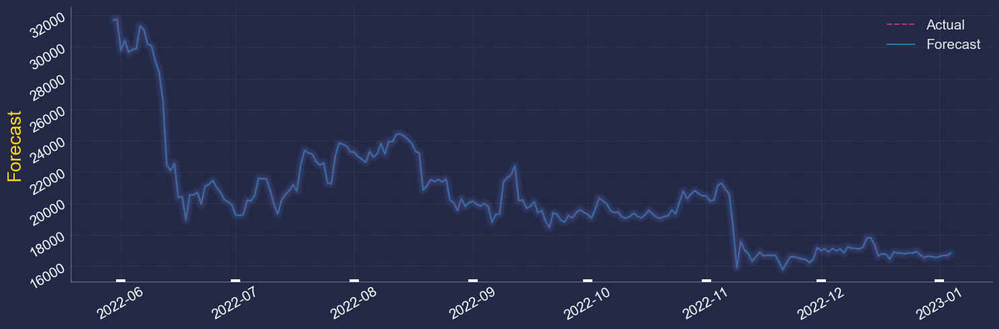

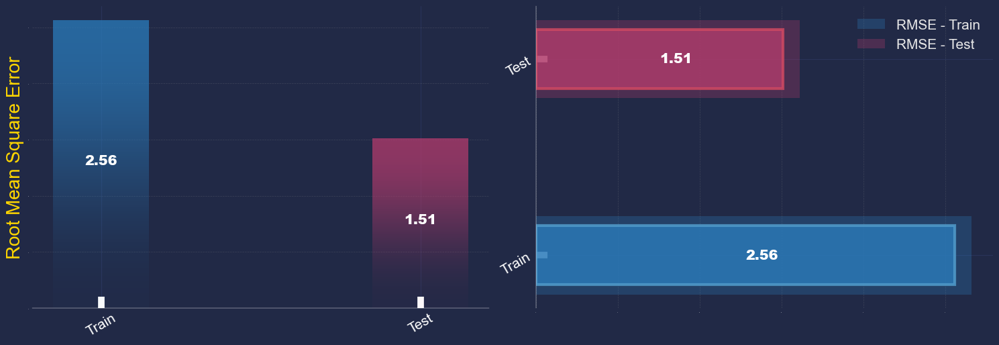

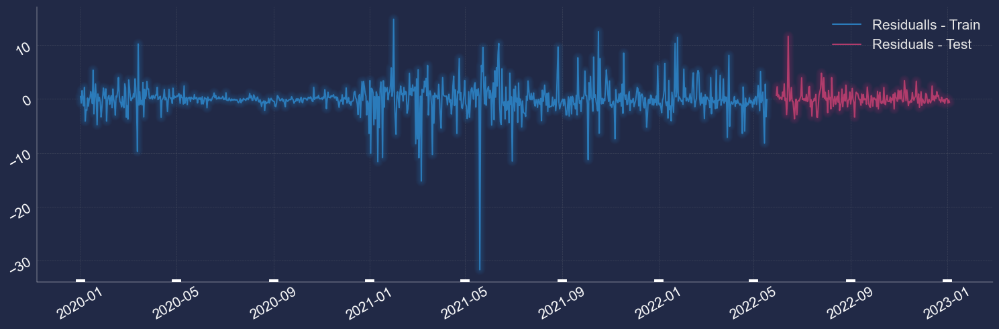

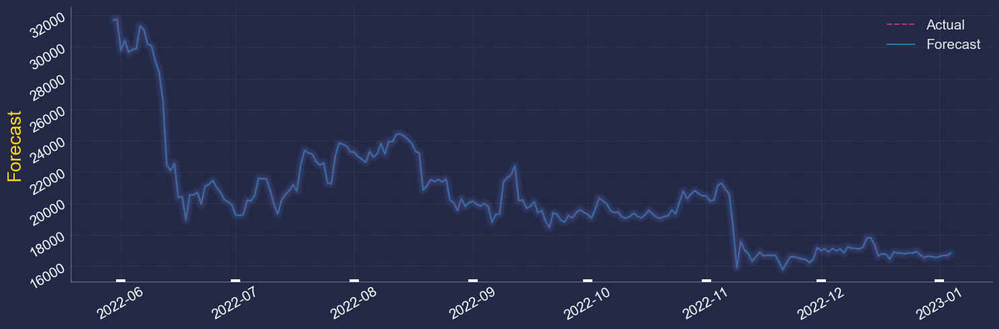

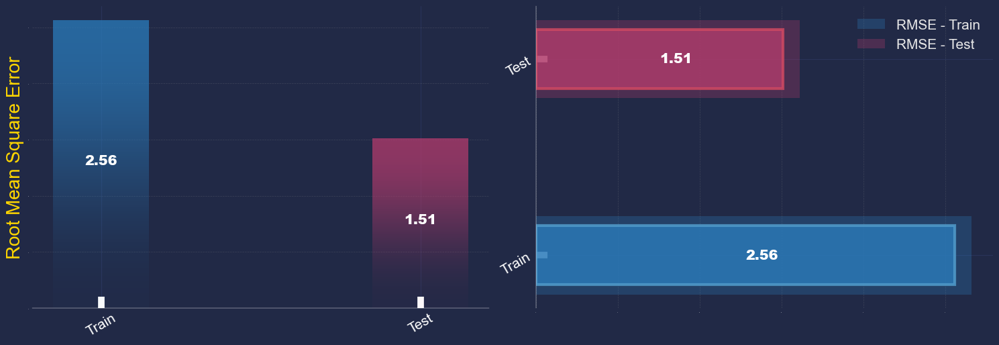

...

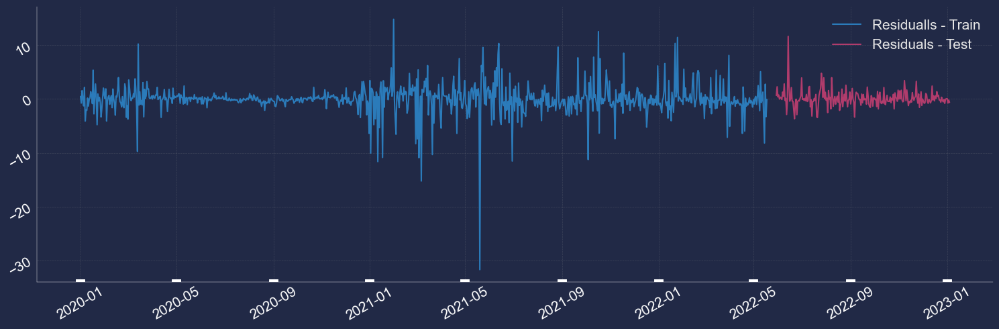

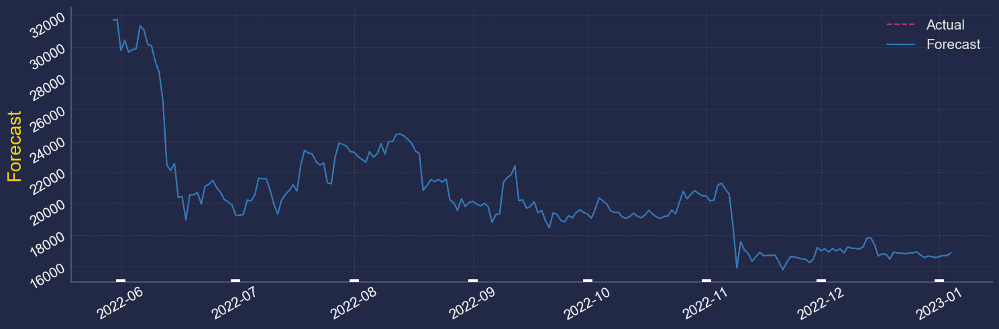

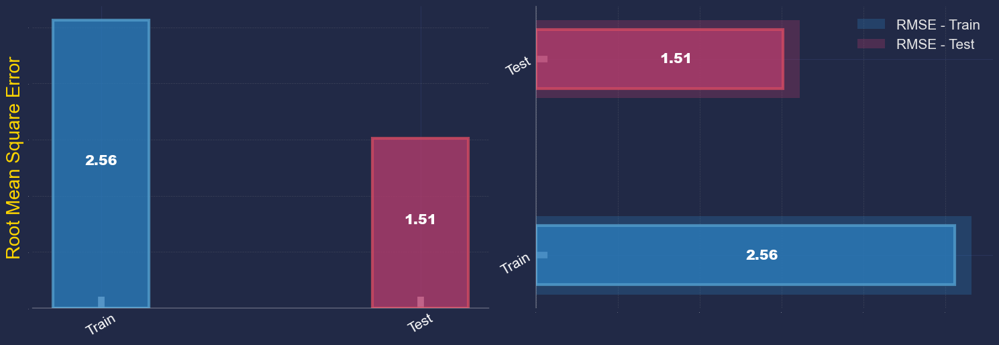

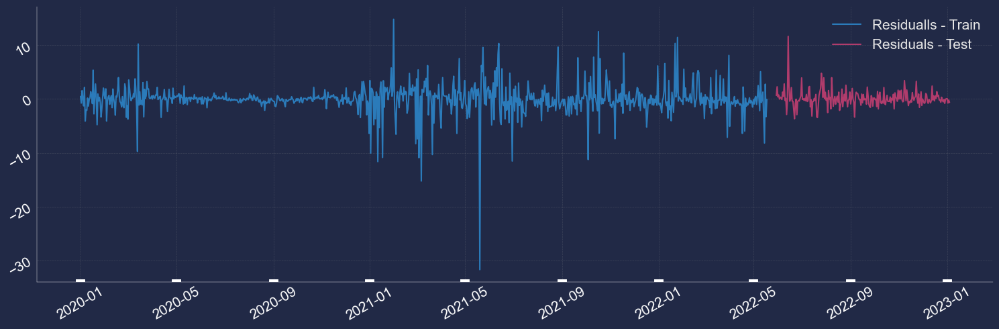

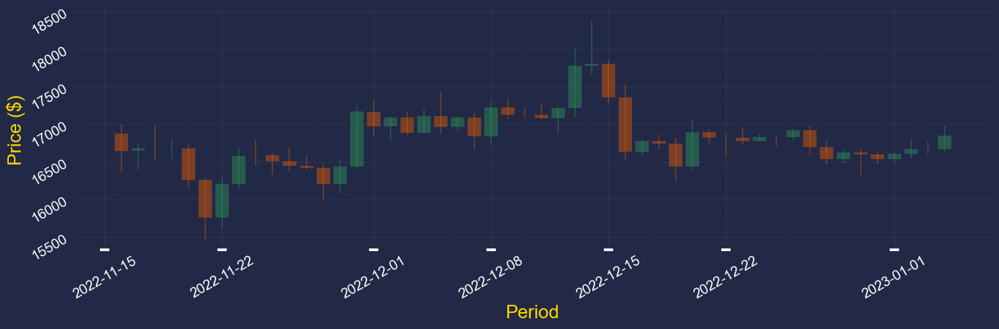

In [20]:
table = df[-50:].copy() 

green_df = table[table.BTCBUSD_Close > table.BTCBUSD_Open].copy()
green_df['Heigth'] = green_df['BTCBUSD_Close'] - green_df['BTCBUSD_Open']

red_df = table[table.BTCBUSD_Close < table.BTCBUSD_Open].copy()
red_df['Heigth'] = red_df['BTCBUSD_Open'] - red_df['BTCBUSD_Close']

pal_green = sns.light_palette("seagreen") #Color
pal_orangered = sns.color_palette("YlOrBr") #Color

plt.style.use("cyberpunk") #Background color

fig = plt.figure(figsize=(15,5), tight_layout=True) #Size of plot dpi=300 for better quality

index = table.index.copy()
index = pd.to_datetime(index)

for i in range(len(table)):
    if table['BTCBUSD_Close'][i] > table['BTCBUSD_Open'][i]:
        plt.vlines(x=index[i], ymin=table['BTCBUSD_Low'][i], ymax=table['BTCBUSD_High'][i], alpha=0.4, colors=pal_green[5])
    elif table['BTCBUSD_Close'][i] < table['BTCBUSD_Open'][i]:
        plt.vlines(x=index[i], ymin=table['BTCBUSD_Low'][i], ymax=table['BTCBUSD_High'][i], alpha=0.4, colors=pal_orangered[4])
    else:
        plt.vlines(x=index[i], ymin=table['BTCBUSD_Low'][i], ymax=table['BTCBUSD_High'][i], alpha=0.4, colors='White')
            

plt.bar(x=green_df.index, height=green_df['Heigth'], bottom=green_df['BTCBUSD_Open'], alpha=0.5, color=pal_green[5]) #color=pal_green[5] , linewidth=2 , fill=False
plt.bar(x=red_df.index, height=red_df['Heigth'], bottom=red_df['BTCBUSD_Close'], alpha=0.5, color=pal_orangered[4]) #color=pal_orangered[4] , linewidth=2 , fill=False

plt.tick_params(axis='x', labelrotation=30, labelsize=15, width=10, length=3, direction="in", colors='White') #Rotation label x and y
plt.tick_params(axis='y', labelrotation=30, labelsize=15, colors='White') #Rotation label x and y
plt.grid(zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot
plt.xlabel('Period', fontsize=20, color='Gold') #Left title
plt.ylabel('Price ($)', fontsize=20, color='Gold') #Bottom title
#plt.yticks(range(15500,20000,500), ["{} $".format(v) for v in range(15500,20000,500)])

plt.show()

In [12]:
df

,Target_BTCBUSD_Open,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,BCHBUSD_Low,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,7177.13,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,...,202.63,203.65,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593
2020-01-02,6944.41,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,...,192.41,195.44,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530
2020-01-03,7330.91,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,...,192.22,221.76,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624
2020-01-04,7346.20,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,...,219.37,224.18,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640
2020-01-05,7349.84,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,...,221.05,222.62,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,16534.83,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,96.50,97.10,0.07240,0.07240,0.07080,0.07110,1.833,1.850,1.828,1.831
2023-01-01,16610.69,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,96.10,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877
2023-01-02,16667.39,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,95.40,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907


In [8]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from sklearn.model_selection import train_test_split

X = df.iloc[:, 1:]
y = df.iloc[:, 0]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

In [9]:
model = Sequential([Dense(4, activation='relu'),
                    Dense(2, activation='relu'),
                    Dense(4, activation='relu'),
                    Dense(1)])

model.compile(optimizer='rmsprop', loss='mse')

In [50]:
model.fit(x=X_train, y=y_train,
          validation_data=(X_test,y_test),
          epochs=300)

Epoch 1/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 56651380.0000 - val_loss: 59768184.0000
Epoch 2/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 31179722.0000 - val_loss: 78848576.0000
Epoch 3/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37817308.0000 - val_loss: 81255704.0000
Epoch 4/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37360680.0000 - val_loss: 92177632.0000
Epoch 5/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 39617316.0000 - val_loss: 90628672.0000
Epoch 6/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37582000.0000 - val_loss: 98988096.0000
Epoch 7/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 39110944.0000 - val_loss: 98096576.0000
Epoch 8/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37698088.0000 - val_loss: 104547888.0000
Epoch 9/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 38752220.0000 - val_loss: 104978152.0000
Epoch 10/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37736484.0000 - val_loss: 110758632.0000
Epoch 

Epoch 62/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37442536.0000 - val_loss: 266822240.0000
Epoch 63/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37439724.0000 - val_loss: 266737056.0000
Epoch 64/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37430652.0000 - val_loss: 266670736.0000
Epoch 65/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37427220.0000 - val_loss: 266587248.0000
Epoch 66/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37418764.0000 - val_loss: 266519600.0000
Epoch 67/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37414800.0000 - val_loss: 266437680.0000
Epoch 68/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37406808.0000 - val_loss: 266367728.0000
Epoch 69/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37402488.0000 - val_loss: 266287584.0000
Epoch 70/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37394824.0000 - val_loss: 266217552.0000
Epoch 71/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37390156.0000 - val_loss: 26613

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36732104.0000 - val_loss: 257730080.0000
Epoch 183/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36726192.0000 - val_loss: 257654864.0000
Epoch 184/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36720604.0000 - val_loss: 257578304.0000
Epoch 185/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36714624.0000 - val_loss: 257502576.0000
Epoch 186/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36709068.0000 - val_loss: 257426016.0000
Epoch 187/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36703132.0000 - val_loss: 257350496.0000
Epoch 188/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36697536.0000 - val_loss: 257273808.0000
Epoch 189/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36691644.0000 - val_loss: 257197728.0000
Epoch 190/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36686012.0000 - val_loss: 257121168.0000
Epoch 191/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36680220.0000 - val_loss: 257045408

<AxesSubplot:>

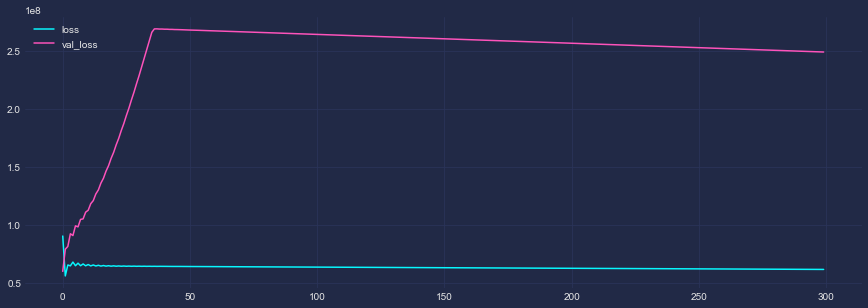

In [51]:
loss_df_mse = pd.DataFrame(model.history.history)

plt.style.use("cyberpunk") #Background color
loss_df_mse.plot(figsize=(15,5))

In [52]:
predict_tr = model.predict(X_train)
dataframe_act_tr = pd.DataFrame(y_train, index=y_train.index)
dataframe_pred_tr = pd.DataFrame(predict_tr, columns=['Predict'], index=y_train.index)

predict = model.predict(X_test)
dataframe_act = pd.DataFrame(y_test, index=y_test.index)
dataframe_pred = pd.DataFrame(predict, columns=['Predict'], index=y_test.index)

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step


In [53]:
dataframe_act_pred_tr = pd.concat([dataframe_act_tr,dataframe_pred_tr], axis=1)

dataframe_act_pred = pd.concat([dataframe_act,dataframe_pred], axis=1)

<AxesSubplot:xlabel='Open time'>

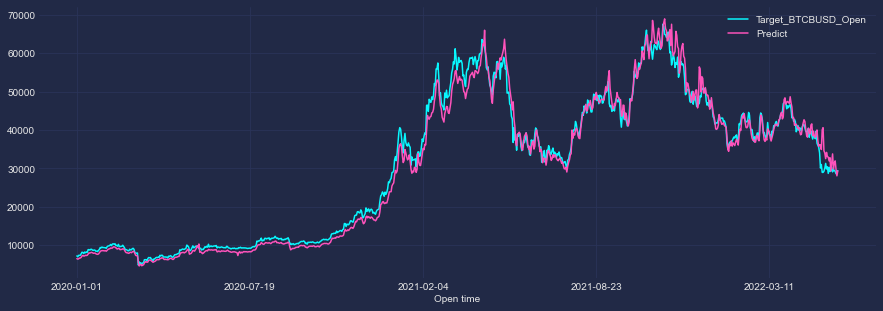

In [54]:
plt.style.use("cyberpunk") #Background color
dataframe_act_pred_tr.plot(figsize=(15,5))

<AxesSubplot:xlabel='Open time'>

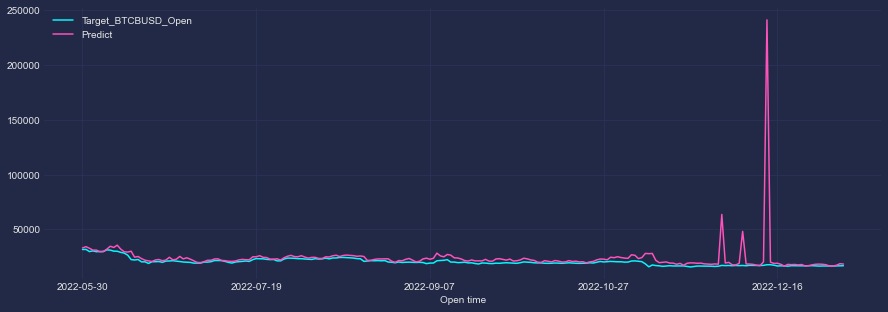

In [55]:
plt.style.use("cyberpunk") #Background color
dataframe_act_pred.plot(figsize=(15,5))

In [ ]:
model.fit()

In [1]:


class Myself:
    """
    A class to represent a person. (Actually just for me)
    """
    def __init__(self):
        self.name = "Angelos - Michail Voudouris"
        self.pronouns = "he/him"
        self.role = "Data Scientist"
        self.bsc_studies = ("B.Sc in Department of Informatics, University of Western Macedonia")
        self.msc_studies = ("MSc in Data Science at International Hellenic University of Thessaloniki")
        self.language_spoken = ["el_GR", "en_US"]
        self.country = "Hellenic"
        self.city = "Thessaloniki"
        self.soft_values = ["Communication | Problem-Solving | Collaboration | Critical Thinking"]

    def hi_all(self):
        print("Hope you find some of my work interesting. I'll be happy to connect with you!")


me = Myself()
me.hi_all()

Hope you find some of my work interesting. I'll be happy to connect with you!
